# 1. Setup & Environment

Phần này khởi tạo môi trường, cài đặt thư viện và định nghĩa các hàm hỗ trợ trực quan hóa (Visualization).

## 1.1. Cài đặt và Import thư viện

In [1]:
!pip install mediapipe
!wget -q https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 11.2 MB/s eta 0:00:00
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.


In [2]:
!pip list | grep mediapipe

mediapipe                                0.10.32


In [3]:
import os
import cv2
import time
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# MediaPipe & Tasks API
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
# from mediapipe.framework.formats import landmark_pb2

# Deep Learning (TensorFlow/Keras)
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Sklearn Metrics & Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_class_weight

# Config hiển thị
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

2026-02-12 01:35:19.038215: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1770860119.238094      25 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1770860119.293592      25 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1770860119.756528      25 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1770860119.756576      25 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1770860119.756579      25 computation_placer.cc:177] computation placer alr

## 1.2. Định nghĩa hàm vẽ Landmarks (Custom)

Hàm này giúp vẽ các khớp tay với màu sắc riêng biệt cho từng ngón để dễ quan sát.

In [4]:
def to_pixel(x_norm: float, y_norm: float, w: int, h: int) -> tuple[int, int]:
    x = min(max(x_norm, 0.0), 1.0)
    y = min(max(y_norm, 0.0), 1.0)
    return int(x * w), int(y * h)

def draw_landmarks_on_image_new(rgb_image, detection_result):
    """Vẽ landmarks với màu sắc riêng cho từng ngón tay."""
    hand_landmarks_list = detection_result.hand_landmarks
    annotated_image = np.copy(rgb_image)
    h, w = annotated_image.shape[:2]

    # Định nghĩa các đốt ngón tay
    fingers_connections = {
        "thumb":  [(0, 1), (1, 2), (2, 3), (3, 4)],
        "index":  [(0, 5), (5, 6), (6, 7), (7, 8)],
        "middle": [(0, 9), (9, 10), (10, 11), (11, 12)],
        "ring":   [(0, 13), (13, 14), (14, 15), (15, 16)],
        "pinky":  [(0, 17), (17, 18), (18, 19), (19, 20)]
    }

    # Màu sắc (RGB)
    finger_colors = {
        "thumb":  (255, 0, 0),    # Đỏ
        "index":  (0, 255, 0),    # Xanh lá
        "middle": (0, 0, 255),    # Xanh dương
        "ring":   (255, 255, 0),  # Vàng
        "pinky":  (255, 0, 255)   # Tím
    }

    if hand_landmarks_list:
        for hand_landmarks in hand_landmarks_list:
            pts = [to_pixel(lm.x, lm.y, w, h) for lm in hand_landmarks]
            
            # Vẽ đường nối
            for finger, connections in fingers_connections.items():
                color = finger_colors[finger]
                for idx_a, idx_b in connections:
                    cv2.line(annotated_image, pts[idx_a], pts[idx_b], color, 2)
            
            # Vẽ điểm khớp
            for (x, y) in pts:
                cv2.circle(annotated_image, (x, y), 3, (255, 255, 255), -1)
                cv2.circle(annotated_image, (x, y), 4, (0, 0, 0), 1)

    return annotated_image

# 2. Data Processing

## 2.0. KHAI THÁC VÀ TỔNG HỢP DỮ LIỆU ĐA NGUỒN

Chúng ta sẽ sử dụng các nguồn dữ liệu sau:

    asl-dataset

    asl-alphabet-dataset

    hand-signs-asl-hand-sign-data

    synthetic-asl-alphabet

    asl-alphabet---numbers-q3uka (Roboflow)

Mục tiêu là tạo ra 2 thư mục thống nhất tại /kaggle/working/:

    ASL_TOTAL_TRAIN: Chứa toàn bộ ảnh huấn luyện của tất cả các nguồn, phân theo folder (A, B, C...).

    ASL_TOTAL_TEST: Chứa toàn bộ ảnh kiểm thử có nhãn.

### 2.0.0: Tải dữ liệu từ Roboflow (Dataset Forked)

In [5]:
# Cai dat thu vien Roboflow
!pip install roboflow

from roboflow import Roboflow
import os

# --- CAU HINH API ROBOFLOW ---
API_KEY = "L12DuJWJpYFM0iUin2Bd"
WORKSPACE = "asldataset-vnjwq"
PROJECT = "asl-alphabet---numbers-q3uka"
VERSION = 1 

try:
    print(f"Dang ket noi toi Roboflow Project: {PROJECT}...")
    rf = Roboflow(api_key=API_KEY)
    project = rf.workspace(WORKSPACE).project(PROJECT)
    version = project.version(VERSION)
    
    # THAY DOI QUAN TRONG: Tai ve dinh dang YOLOv8 (ho tro Object Detection)
    dataset = version.download("yolov8")
    
    ROBOFLOW_RAW_DIR = dataset.location
    print(f"\nDa tai du lieu THO (YOLO) vao: {ROBOFLOW_RAW_DIR}")
    
except Exception as e:
    print(f"Loi khi tai du lieu: {e}")
    ROBOFLOW_RAW_DIR = None

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 54.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.22.1 requires google-cloud-bigquery-storage>=2.0.0, wh


Extracting Dataset Version Zip to ASL-Alphabet-&-Numbers-1 in yolov8:: 100%|██████████| 6210/6210 [00:00<00:00, 8676.99it/s]



Da tai du lieu THO (YOLO) vao: /kaggle/working/ASL-Alphabet-&-Numbers-1


#### 2.0.0.1: Chuyển đổi YOLO sang Folder Structure

Cell này sẽ đọc file cấu hình data.yaml của YOLO để lấy tên lớp, sau đó di chuyển ảnh vào các thư mục tương ứng.

In [6]:
import yaml
import shutil
from tqdm.notebook import tqdm
import os

# Dinh nghia duong dan dau ra cho du lieu da chuyen doi
ROBOFLOW_DATASET_DIR = "/kaggle/working/Roboflow_Converted_Format"

def convert_yolo_to_folder_structure(yolo_dir, output_dir):
    if yolo_dir is None: return

    print(f"Dang chuyen doi tu YOLO -> Folder Structure...")
    print(f"Nguon: {yolo_dir}")
    print(f"Dich:  {output_dir}")

    # 1. Doc file data.yaml de lay ten cac Class
    yaml_path = os.path.join(yolo_dir, "data.yaml")
    if not os.path.exists(yaml_path):
        print("Loi: Khong tim thay file data.yaml")
        return

    with open(yaml_path, 'r') as f:
        data_config = yaml.safe_load(f)
        class_names = data_config['names'] 
    
    print(f"Tim thay {len(class_names)} lop: {class_names[:5]}...")

    # 2. Duyet qua cac tap train, valid, test
    for split in ['train', 'valid', 'test']:
        src_split_dir = os.path.join(yolo_dir, split)
        images_dir = os.path.join(src_split_dir, 'images')
        labels_dir = os.path.join(src_split_dir, 'labels')
        
        if not os.path.exists(images_dir): continue

        dest_split_dir = os.path.join(output_dir, split)
        if not os.path.exists(dest_split_dir):
            os.makedirs(dest_split_dir)

        # Duyet qua cac file anh
        image_files = os.listdir(images_dir)
        
        for img_name in tqdm(image_files, desc=f"Converting {split}", leave=False):
            if not (img_name.endswith('.jpg') or img_name.endswith('.png')): continue

            # Tim file label tuong ung
            label_name = os.path.splitext(img_name)[0] + ".txt"
            label_path = os.path.join(labels_dir, label_name)
            
            if os.path.exists(label_path):
                with open(label_path, 'r') as lf:
                    lines = lf.readlines()
                    if len(lines) > 0:
                        class_id = int(lines[0].split()[0])
                        class_name = class_names[class_id]
                        
                        dest_class_dir = os.path.join(dest_split_dir, class_name)
                        if not os.path.exists(dest_class_dir):
                            os.makedirs(dest_class_dir)
                        
                        src_img_path = os.path.join(images_dir, img_name)
                        dest_img_path = os.path.join(dest_class_dir, img_name)
                        shutil.copy(src_img_path, dest_img_path)

    print(f"\nCHUYEN DOI HOAN TAT. Du lieu moi tai: {output_dir}")
    
    # --- THEM MOI: XOA DU LIEU GOC DE GIAI PHONG BO NHO ---
    print(f"Dang xoa du lieu tho tai {yolo_dir} de tiet kiem dung luong...")
    try:
        shutil.rmtree(yolo_dir)
        print("Da xoa thanh cong du lieu tho.")
    except Exception as e:
        print(f"Khong the xoa du lieu tho: {e}")
        
    return output_dir

# Thuc hien chuyen doi
if 'ROBOFLOW_RAW_DIR' in globals() and ROBOFLOW_RAW_DIR:
    ROBOFLOW_DATASET_DIR = convert_yolo_to_folder_structure(ROBOFLOW_RAW_DIR, ROBOFLOW_DATASET_DIR)

Dang chuyen doi tu YOLO -> Folder Structure...
Nguon: /kaggle/working/ASL-Alphabet-&-Numbers-1
Dich:  /kaggle/working/Roboflow_Converted_Format
Tim thay 40 lop: ['A', 'B', 'C', 'D', 'E']...


Converting train:   0%|          | 0/2175 [00:00<?, ?it/s]

Converting valid:   0%|          | 0/485 [00:00<?, ?it/s]

Converting test:   0%|          | 0/439 [00:00<?, ?it/s]


CHUYEN DOI HOAN TAT. Du lieu moi tai: /kaggle/working/Roboflow_Converted_Format
Dang xoa du lieu tho tai /kaggle/working/ASL-Alphabet-&-Numbers-1 de tiet kiem dung luong...
Da xoa thanh cong du lieu tho.


Khám phá cấu trúc dữ liệu mới trong Roboflow

Cell này kiểm tra xem bộ dữ liệu vừa tải về có những thư mục nào (train, valid, test) và chứa những class nào bên trong.

In [7]:
import os

print("--- DANH SACH CLASS TRONG DATASET ROBOFLOW ---")

if 'ROBOFLOW_DATASET_DIR' in globals() and ROBOFLOW_DATASET_DIR is not None:
    # Thuong thi folder 'train' se chua day du class nhat
    target_split = 'train'
    check_path = os.path.join(ROBOFLOW_DATASET_DIR, target_split)
    
    if not os.path.exists(check_path):
        # Fallback neu khong co folder train
        check_path = os.path.join(ROBOFLOW_DATASET_DIR, 'valid')

    if os.path.exists(check_path):
        # Lay tat ca ten folder (ten class)
        all_classes = sorted([d for d in os.listdir(check_path) if os.path.isdir(os.path.join(check_path, d))])
        
        # Phan loai
        digits = []      # 0-9
        letters = []     # A-Z
        words_others = [] # Hello, Right, Space, Delete...

        for cls in all_classes:
            cls_clean = cls.strip().upper()
            
            if cls_clean.isdigit():
                digits.append(cls)
            elif cls_clean.isalpha() and len(cls_clean) == 1:
                letters.append(cls)
            else:
                words_others.append(cls)

        # --- IN KET QUA ---
        print(f"Tong so class tim thay: {len(all_classes)}")
        
        print(f"\n1. NHOM CHU SO ({len(digits)}):")
        print(digits)
        
        print(f"\n2. NHOM CHU CAI ({len(letters)}):")
        print(letters)
        
        print(f"\n3. NHOM TU VUNG / KY HIEU KHAC ({len(words_others)}):")
        print(words_others)
        
        print("\n---------------------------------------------------")
        print("LUU Y QUAN TRONG:")
        print("- Cac folder trong Nhom 3 thuong la: 'nothing', 'space', 'del' hoac cac tu nhu 'hello'.")
        print("- Voi cac tu chuyen dong ('hello', 'right'), du lieu trong folder van la ANH TINH (Static Images).")
        print("- Do la cac khung hinh (frames) duoc cat ra tu video cu chi tay.")
    else:
        print(f"Khong tim thay thu muc {target_split} trong {ROBOFLOW_DATASET_DIR}")
else:
    print("Chua co bien ROBOFLOW_DATASET_DIR. Hay chay cell tai du lieu truoc.")

--- DANH SACH CLASS TRONG DATASET ROBOFLOW ---
Tong so class tim thay: 40

1. NHOM CHU SO (0):
[]

2. NHOM CHU CAI (26):
['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

3. NHOM TU VUNG / KY HIEU KHAC (14):
['eight', 'five', 'four', 'hello', 'help', 'nine', 'one', 'right', 'seven', 'six', 'thanks', 'three', 'two', 'zero']

---------------------------------------------------
LUU Y QUAN TRONG:
- Cac folder trong Nhom 3 thuong la: 'nothing', 'space', 'del' hoac cac tu nhu 'hello'.
- Voi cac tu chuyen dong ('hello', 'right'), du lieu trong folder van la ANH TINH (Static Images).
- Do la cac khung hinh (frames) duoc cat ra tu video cu chi tay.


#### 2.0.0.2: Chuẩn hóa tên lớp (Rename Words to Digits)

In [8]:
import os
import shutil

# Dinh nghia ban do chuyen doi (Mapping)
# Chi chuyen doi cac so, giu nguyen cac tu vung khac nhu hello, help...
RENAME_MAPPING = {
    'zero': '0',
    'one': '1',
    'two': '2',
    'three': '3',
    'four': '4',
    'five': '5',
    'six': '6',
    'seven': '7',
    'eight': '8',
    'nine': '9'
}

def rename_folders(dataset_dir):
    if dataset_dir is None or not os.path.exists(dataset_dir):
        print("Duong dan dataset khong ton tai.")
        return

    print(f"Dang thuc hien doi ten folder tai: {dataset_dir}")
    
    count_renamed = 0
    
    # Duyet qua cac tap con (train, valid, test)
    for split in ['train', 'valid', 'test']:
        split_path = os.path.join(dataset_dir, split)
        if not os.path.exists(split_path): continue
        
        # Duyet qua danh sach can doi ten
        for old_name, new_name in RENAME_MAPPING.items():
            old_path = os.path.join(split_path, old_name)
            new_path = os.path.join(split_path, new_name)
            
            # Neu tim thay folder ten cu ('zero')
            if os.path.exists(old_path):
                # Neu folder ten moi ('0') chua co -> Doi ten truc tiep
                if not os.path.exists(new_path):
                    os.rename(old_path, new_path)
                    print(f"[{split}] Doi ten: '{old_name}' -> '{new_name}'")
                    count_renamed += 1
                else:
                    # Neu folder '0' da ton tai (hiem gap), gop noi dung sang '0' va xoa 'zero'
                    print(f"[{split}] Gop noi dung: '{old_name}' -> '{new_name}'")
                    for file in os.listdir(old_path):
                        shutil.move(os.path.join(old_path, file), os.path.join(new_path, file))
                    os.rmdir(old_path)
                    count_renamed += 1
                    
    print(f"\nHoan tat! Da doi ten/gop {count_renamed} thu muc.")

# Thuc thi
if 'ROBOFLOW_DATASET_DIR' in globals():
    rename_folders(ROBOFLOW_DATASET_DIR)

Dang thuc hien doi ten folder tai: /kaggle/working/Roboflow_Converted_Format
[train] Doi ten: 'zero' -> '0'
[train] Doi ten: 'one' -> '1'
[train] Doi ten: 'two' -> '2'
[train] Doi ten: 'three' -> '3'
[train] Doi ten: 'four' -> '4'
[train] Doi ten: 'five' -> '5'
[train] Doi ten: 'six' -> '6'
[train] Doi ten: 'seven' -> '7'
[train] Doi ten: 'eight' -> '8'
[train] Doi ten: 'nine' -> '9'
[valid] Doi ten: 'zero' -> '0'
[valid] Doi ten: 'one' -> '1'
[valid] Doi ten: 'two' -> '2'
[valid] Doi ten: 'three' -> '3'
[valid] Doi ten: 'four' -> '4'
[valid] Doi ten: 'five' -> '5'
[valid] Doi ten: 'six' -> '6'
[valid] Doi ten: 'seven' -> '7'
[valid] Doi ten: 'eight' -> '8'
[valid] Doi ten: 'nine' -> '9'
[test] Doi ten: 'zero' -> '0'
[test] Doi ten: 'one' -> '1'
[test] Doi ten: 'two' -> '2'
[test] Doi ten: 'three' -> '3'
[test] Doi ten: 'four' -> '4'
[test] Doi ten: 'five' -> '5'
[test] Doi ten: 'six' -> '6'
[test] Doi ten: 'seven' -> '7'
[test] Doi ten: 'eight' -> '8'
[test] Doi ten: 'nine' -> '9'

Ho

#### 2.0.0.3: Kiểm tra trực quan toàn bộ Dataset (Visual Inspection)

Cell này sẽ hiển thị 1 ảnh đại diện cho mỗi class trong tập Train, được sắp xếp theo thứ tự logic (Số -> Chữ -> Từ vựng) để bạn dễ dàng rà soát chất lượng ảnh.

Tong so lop: 40
- So (10): ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
- Chu (26): ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
- Khac (4): ['hello', 'help', 'right', 'thanks']


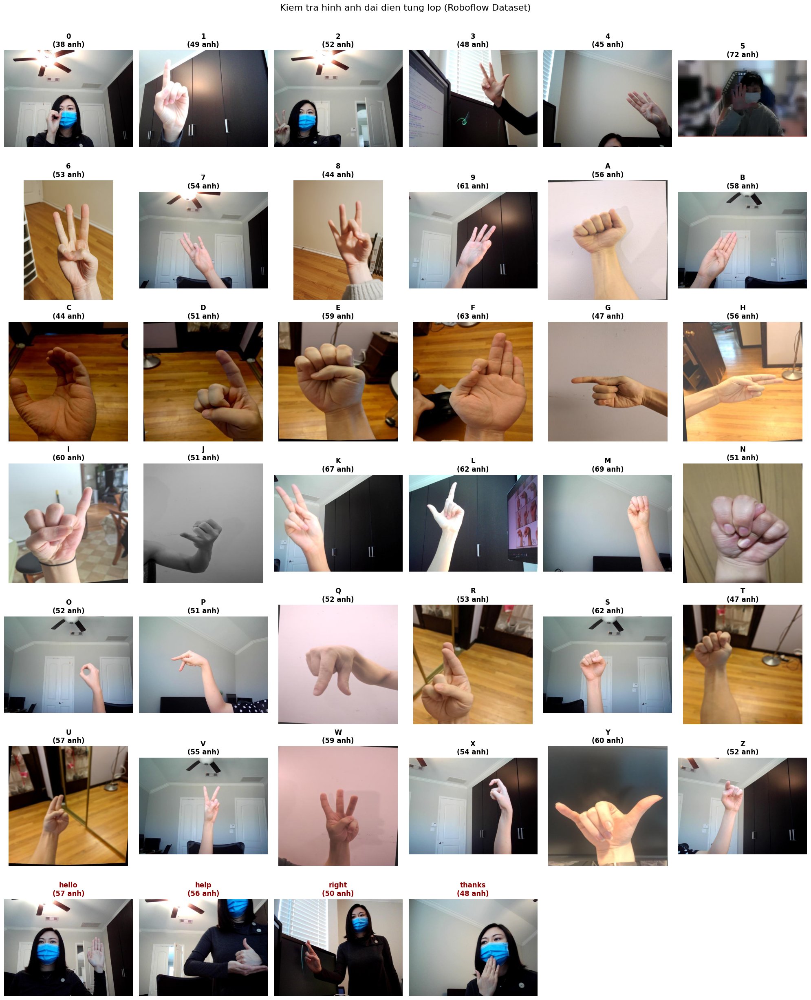

In [9]:
import matplotlib.pyplot as plt
import cv2
import math

if 'ROBOFLOW_DATASET_DIR' in globals() and ROBOFLOW_DATASET_DIR is not None:
    train_dir = os.path.join(ROBOFLOW_DATASET_DIR, 'train')
    
    if os.path.exists(train_dir):
        # 1. Lay danh sach tat ca cac class hien co
        all_classes = sorted([d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))])
        
        # 2. Phan loai va Sap xep
        digits = sorted([c for c in all_classes if c.isdigit()])
        letters = sorted([c for c in all_classes if c.isalpha() and len(c) == 1])
        others = sorted([c for c in all_classes if c not in digits and c not in letters])
        
        # Gop lai theo thu tu mong muon
        sorted_classes = digits + letters + others
        
        print(f"Tong so lop: {len(sorted_classes)}")
        print(f"- So ({len(digits)}): {digits}")
        print(f"- Chu ({len(letters)}): {letters}")
        print(f"- Khac ({len(others)}): {others}")
        
        # 3. Cau hinh luoi hien thi
        num_images = len(sorted_classes)
        cols = 6
        rows = math.ceil(num_images / cols)
        
        plt.figure(figsize=(20, 3.5 * rows))
        
        # 4. Ve anh
        for idx, cls_name in enumerate(sorted_classes):
            cls_path = os.path.join(train_dir, cls_name)
            files = os.listdir(cls_path)
            
            if len(files) > 0:
                # Lay anh dau tien
                img_name = files[0]
                img_path = os.path.join(cls_path, img_name)
                
                img = cv2.imread(img_path)
                if img is not None:
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    
                    plt.subplot(rows, cols, idx + 1)
                    plt.imshow(img_rgb)
                    
                    # Tieu de mau xanh la neu la So/Chu, mau do neu la Tu vung (de chu y)
                    title_color = 'darkred' if cls_name in others else 'black'
                    
                    plt.title(f"{cls_name}\n({len(files)} anh)", color=title_color, fontsize=12, fontweight='bold')
                    plt.axis('off')
            else:
                plt.subplot(rows, cols, idx + 1)
                plt.text(0.5, 0.5, "Empty", ha='center', va='center')
                plt.title(f"{cls_name}", color='gray')
                plt.axis('off')

        plt.suptitle("Kiem tra hinh anh dai dien tung lop (Roboflow Dataset)", fontsize=16, y=1.01)
        plt.tight_layout()
        plt.show()
        
    else:
        print(f"Khong tim thay thu muc train tai: {train_dir}")

### 2.0.1: Khám phá cấu trúc thư mục gốc

Cell này giúp in ra cấu trúc cây thư mục để biết chính xác đường dẫn chứa ảnh (Train/Test) nằm ở đâu trong các dataset đầu vào.

In [10]:
import os

# Danh sách các dataset đầu vào
INPUT_ROOTS = [
    '/kaggle/input/asl-dataset/asl_dataset',
    '/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset',
    '/kaggle/input/hand-signs-asl-hand-sign-data/DATASET',
    '/kaggle/input/synthetic-asl-alphabet/Test_Alphabet', # Lưu ý: Đây chỉ là folder Test, cần check folder cha để lấy Train
    '/kaggle/input/synthetic-asl-alphabet/Train_Alphabet' # Thêm đường dẫn Train của bộ Synthetic
]

print("--- KHÁM PHÁ CẤU TRÚC DỮ LIỆU ---")

def list_dirs_only(path, depth=1):
    if depth < 0: return
    try:
        if os.path.isdir(path):
            subdirs = sorted([d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))])
            # Chỉ in nếu folder chứa ít hơn 50 folder con (để tránh in hết A-Z làm rối màn hình)
            if len(subdirs) > 0:
                print(f"{path}")
                if len(subdirs) > 10:
                    print(f"   ├── Gồm {len(subdirs)} thư mục con: {subdirs[:5]} ... {subdirs[-5:]}")
                else:
                    print(f"   ├── {subdirs}")
                
                # Đệ quy
                for d in subdirs:
                    # Chỉ đi sâu vào các folder chính, không đi vào từng folder chữ cái
                    if d.lower() in ['train', 'test', 'dataset', 'asl_alphabet_train', 'asl_alphabet_test', 'asl_dataset']:
                        list_dirs_only(os.path.join(path, d), depth-1)
    except Exception as e:
        print(f"Lỗi truy cập {path}: {e}")

# Kiểm tra thư mục gốc của Kaggle input
print("ROOT: /kaggle/input")
for item in os.listdir("/kaggle/input"):
    full_path = os.path.join("/kaggle/input", item)
    list_dirs_only(full_path, depth=2)

--- KHÁM PHÁ CẤU TRÚC DỮ LIỆU ---
ROOT: /kaggle/input
/kaggle/input/hand-signs-asl-hand-sign-data
   ├── ['DATASET']
/kaggle/input/hand-signs-asl-hand-sign-data/DATASET
   ├── Gồm 36 thư mục con: ['0', '1', '2', '3', '4'] ... ['V', 'W', 'X', 'Y', 'Z']
/kaggle/input/aslamerican-sign-language-aplhabet-dataset
   ├── ['ASL_Alphabet_Dataset']
/kaggle/input/mendeleydata-asl-signs-language-detection
   ├── ['ASL signs used for sign language detection']
/kaggle/input/asl-dataset
   ├── ['asl_dataset']
/kaggle/input/asl-dataset/asl_dataset
   ├── Gồm 37 thư mục con: ['0', '1', '2', '3', '4'] ... ['v', 'w', 'x', 'y', 'z']
/kaggle/input/asl-dataset/asl_dataset/asl_dataset
   ├── Gồm 36 thư mục con: ['0', '1', '2', '3', '4'] ... ['v', 'w', 'x', 'y', 'z']
/kaggle/input/synthetic-asl-alphabet
   ├── ['Test_Alphabet', 'Train_Alphabet']


### 2.0.2: Tạo ASL_TOTAL_TRAIN và ASL_TOTAL_TEST (Sử dụng Symlink)

Cell này thực hiện logic quan trọng: Map các folder từ nguồn vào đích chung. Tôi đã chuẩn hóa tên nhãn (ví dụ đưa hết về chữ in hoa).

In [11]:
import shutil
import random
import os

# 1. Dinh nghia duong dan dich
TOTAL_TRAIN_DIR = '/kaggle/working/ASL_TOTAL_TRAIN'
TOTAL_TEST_DIR = '/kaggle/working/ASL_TOTAL_TEST'

# Xoa neu da ton tai de lam moi
if os.path.exists(TOTAL_TRAIN_DIR): shutil.rmtree(TOTAL_TRAIN_DIR)
if os.path.exists(TOTAL_TEST_DIR): shutil.rmtree(TOTAL_TEST_DIR)

os.makedirs(TOTAL_TRAIN_DIR)
os.makedirs(TOTAL_TEST_DIR)

print("Da tao thu muc chua: ", TOTAL_TRAIN_DIR, " va ", TOTAL_TEST_DIR)

# 2. Cau hinh Mapping
# Format: (Duong dan nguon, Loai mac dinh, Ti le chia Test cho so)
DATA_SOURCES = [
    # Nguon 1: ASL Alphabet Dataset (Chi dung Train)
    ('/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train', 'TRAIN', 0.0),
    # ('/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_test', 'TEST', 0.0), # Bo qua vi file test nay khong co label folder
    
    # Nguon 2: ASL Dataset (Anh thuc te, bao gom 0-9 va a-z)
    ('/kaggle/input/asl-dataset/asl_dataset/asl_dataset', 'TRAIN', 0.2), 

    # Nguon 3: Hand Signs (Bao gom 0-9 va A-Z)
    ('/kaggle/input/hand-signs-asl-hand-sign-data/DATASET', 'TRAIN', 0.2),

    # Nguon 4: Synthetic ASL (Chi dung Train)
    ('/kaggle/input/synthetic-asl-alphabet/Train_Alphabet', 'TRAIN', 0.0),
    
    # Nguon 5: Synthetic Test (Dua thang vao Test)
    ('/kaggle/input/synthetic-asl-alphabet/Test_Alphabet', 'TEST', 0.0)
]

# --- THEM NGUON DU LIEU MOI TU ROBOFLOW ---
if 'ROBOFLOW_DATASET_DIR' in globals() and ROBOFLOW_DATASET_DIR and os.path.exists(ROBOFLOW_DATASET_DIR):
    print(f"Phat hien dataset Roboflow tai: {ROBOFLOW_DATASET_DIR}")
    
    # Them Train va Valid vao tap TRAIN chung (Ty le chia test = 0.0 vi da co tap test rieng)
    DATA_SOURCES.append((os.path.join(ROBOFLOW_DATASET_DIR, 'train'), 'TRAIN', 0.0))
    DATA_SOURCES.append((os.path.join(ROBOFLOW_DATASET_DIR, 'valid'), 'TRAIN', 0.0))
    
    # Them Test vao tap TEST chung
    DATA_SOURCES.append((os.path.join(ROBOFLOW_DATASET_DIR, 'test'), 'TEST', 0.0))
else:
    print("Canh bao: Khong tim thay bien ROBOFLOW_DATASET_DIR. Dataset moi se khong duoc them vao.")

def merge_datasets(sources):
    count_link = 0
    
    for src_path, default_type, test_ratio in sources:
        # Kiem tra neu duong dan khong ton tai
        if not os.path.exists(src_path):
            print(f"Canh bao: Khong tim thay duong dan {src_path}")
            continue
            
        print(f"Dang xu ly nguon: {src_path}")
        
        # Duyet qua tung folder con
        for label_folder in os.listdir(src_path):
            src_label_path = os.path.join(src_path, label_folder)
            
            if os.path.isdir(src_label_path):
                # --- CHUAN HOA NHAN ---
                label_std = label_folder.strip().upper()
                
                # Gop cac nhan dac biet
                if label_std == 'BLANK': label_std = 'nothing'
                if label_std == 'SPACE': label_std = 'space'
                if label_std == 'DEL': label_std = 'del'
                if label_std == 'NOTHING': label_std = 'nothing'
                
                # --- LOGIC CHIA DU LIEU TRAIN/TEST ---
                dest_type = default_type
                
                # Logic dac biet: Neu la so (0-9) tu cac nguon cu, trich xuat 1 phan sang Test
                if label_std.isdigit() and test_ratio > 0:
                    pass # Se xu ly random ben duoi
                elif default_type == 'TEST':
                    pass
                else:
                    dest_type = 'TRAIN'

                # Tao prefix dua tren ten folder cha de tranh trung ten file
                # Vd: asl_dataset_... hoac Roboflow_Converted_Format_train_...
                parent_name = os.path.basename(os.path.dirname(src_path))
                prefix = parent_name[:10] + "_" 
                
                files = os.listdir(src_label_path)
                for img_name in files:
                    src_file = os.path.join(src_label_path, img_name)
                    
                    # Quyet dinh file nay di ve dau
                    current_dest_type = dest_type
                    
                    # Random chia ve Test (Chi ap dung cho cac nguon co test_ratio > 0)
                    if label_std.isdigit() and test_ratio > 0:
                        if random.random() < test_ratio:
                            current_dest_type = 'TEST'
                        else:
                            current_dest_type = 'TRAIN'
                    
                    # Tao duong dan dich
                    dest_root = TOTAL_TRAIN_DIR if current_dest_type == 'TRAIN' else TOTAL_TEST_DIR
                    dest_label_path = os.path.join(dest_root, label_std)
                    
                    if not os.path.exists(dest_label_path):
                        os.makedirs(dest_label_path)

                    new_name = f"{prefix}{img_name}"
                    dest_file = os.path.join(dest_label_path, new_name)
                    
                    try:
                        # Tao Symlink
                        os.symlink(src_file, dest_file)
                        count_link += 1
                    except FileExistsError:
                        pass 
                    except OSError:
                        # Fallback neu khong ho tro symlink
                        shutil.copy(src_file, dest_file)
                        count_link += 1
                        
    return count_link

total_links = merge_datasets(DATA_SOURCES)
print(f"\nHOAN TAT! Da tong hop {total_links} file ảnh.")

Da tao thu muc chua:  /kaggle/working/ASL_TOTAL_TRAIN  va  /kaggle/working/ASL_TOTAL_TEST
Phat hien dataset Roboflow tai: /kaggle/working/Roboflow_Converted_Format
Dang xu ly nguon: /kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train
Dang xu ly nguon: /kaggle/input/asl-dataset/asl_dataset/asl_dataset
Dang xu ly nguon: /kaggle/input/hand-signs-asl-hand-sign-data/DATASET
Dang xu ly nguon: /kaggle/input/synthetic-asl-alphabet/Train_Alphabet
Dang xu ly nguon: /kaggle/input/synthetic-asl-alphabet/Test_Alphabet
Dang xu ly nguon: /kaggle/working/Roboflow_Converted_Format/train
Dang xu ly nguon: /kaggle/working/Roboflow_Converted_Format/valid
Dang xu ly nguon: /kaggle/working/Roboflow_Converted_Format/test

HOAN TAT! Da tong hop 256588 file ảnh.


#### 2.0.2.1: Cân bằng dữ liệu bằng Augmentation (Sinh dữ liệu mới) cho 0-9 và các từ vựng

In [12]:
# --- CAP NHAT CELL 2.0.2.1: TINH CHINH AUGMENTATION ---
import cv2
import numpy as np
import os
import random
from tqdm.notebook import tqdm

# Giam ty le muc tieu xuong mot chut de tranh lap lai du lieu qua nhieu
TARGET_RATIO = 0.7 
TOTAL_TRAIN_DIR = '/kaggle/working/ASL_TOTAL_TRAIN'
TARGET_CLASSES = [str(i) for i in range(10)] + ['HELLO', 'HELP', 'RIGHT', 'THANKS']

def apply_random_transform(image):
    # 1. Resize ve 256x256
    image = cv2.resize(image, (256, 256))
    rows, cols, _ = image.shape
    
    # 2. Giam goc xoay: Tu 15 xuong 10 do de tranh bien dang cau truc
    angle = random.uniform(-10, 10) 
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    image = cv2.warpAffine(image, M, (cols, rows), borderMode=cv2.BORDER_REFLECT)
    
    # 3. Giam dich chuyen: Tu 10% xuong 8%
    tx = random.uniform(-0.08, 0.08) * cols
    ty = random.uniform(-0.08, 0.08) * rows
    M_trans = np.float32([[1, 0, tx], [0, 1, ty]])
    image = cv2.warpAffine(image, M_trans, (cols, rows), borderMode=cv2.BORDER_REFLECT)
    
    # 4. Chinh do sang/tuong phan (Giu nguyen)
    alpha = random.uniform(0.85, 1.15)
    beta = random.uniform(-20, 20)
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    
    # 5. Giam xac suat nhieu hat: Tu 50% xuong 30%
    if random.random() < 0.3:
        noise = np.random.normal(0, 10, image.shape).astype(np.uint8)
        image = cv2.add(image, noise)
        
    return image

def augment_minority_classes(data_dir, target_classes, target_ratio=0.7):
    # Copy lai noi dung ham augment_minority_classes tu cell cu
    if not os.path.exists(data_dir):
        print("Thu muc du lieu khong ton tai.")
        return

    reference_class = 'A'
    ref_path = os.path.join(data_dir, reference_class)
    
    if os.path.exists(ref_path):
        ref_count = len(os.listdir(ref_path))
        target_count = int(ref_count * target_ratio)
        print(f"Tham chieu lop '{reference_class}': {ref_count} anh.")
        print(f"Muc tieu sinh du lieu: ~{target_count} anh/lop.")
    else:
        target_count = 5000 
        print(f"Khong tim thay lop tham chieu, dat muc tieu mac dinh: {target_count}")

    for cls in target_classes:
        cls_path = os.path.join(data_dir, cls)
        
        if not os.path.exists(cls_path): continue
            
        current_files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        current_count = len(current_files)
        
        if current_count == 0: continue
        
        needed = target_count - current_count
        if needed <= 0:
            print(f"Lop '{cls}' da du du lieu ({current_count}).")
            continue
            
        print(f"Dang xu ly lop '{cls}': Hien co {current_count} -> Can them {needed} anh...")
        
        aug_per_image = int(needed / current_count) + 1
        generated_count = 0
        pbar = tqdm(total=needed, desc=f"Augmenting {cls}", leave=False)
        
        for img_name in current_files:
            if generated_count >= needed: break
            
            img_path = os.path.join(cls_path, img_name)
            original_img = cv2.imread(img_path)
            
            if original_img is None: continue
            
            for i in range(aug_per_image):
                if generated_count >= needed: break
                
                aug_img = apply_random_transform(original_img)
                
                # Luu anh JPG chat luong 85%
                new_filename = f"aug_{generated_count}_{os.path.splitext(img_name)[0]}.jpg"
                save_path = os.path.join(cls_path, new_filename)
                
                cv2.imwrite(save_path, aug_img, [int(cv2.IMWRITE_JPEG_QUALITY), 85])
                
                generated_count += 1
                pbar.update(1)
        
        pbar.close()

print("--- BAT DAU QUA TRINH TANG CUONG DU LIEU (TINH CHINH) ---")
augment_minority_classes(TOTAL_TRAIN_DIR, TARGET_CLASSES, TARGET_RATIO)
print("\nHoan tat tang cuong du lieu!")

--- BAT DAU QUA TRINH TANG CUONG DU LIEU (TINH CHINH) ---
Tham chieu lop 'A': 9517 anh.
Muc tieu sinh du lieu: ~6661 anh/lop.
Dang xu ly lop '0': Hien co 132 -> Can them 6529 anh...


Augmenting 0:   0%|          | 0/6529 [00:00<?, ?it/s]

Dang xu ly lop '1': Hien co 135 -> Can them 6526 anh...


Augmenting 1:   0%|          | 0/6526 [00:00<?, ?it/s]

Dang xu ly lop '2': Hien co 136 -> Can them 6525 anh...


Augmenting 2:   0%|          | 0/6525 [00:00<?, ?it/s]

Dang xu ly lop '3': Hien co 131 -> Can them 6530 anh...


Augmenting 3:   0%|          | 0/6530 [00:00<?, ?it/s]

Dang xu ly lop '4': Hien co 135 -> Can them 6526 anh...


Augmenting 4:   0%|          | 0/6526 [00:00<?, ?it/s]

Dang xu ly lop '5': Hien co 155 -> Can them 6506 anh...


Augmenting 5:   0%|          | 0/6506 [00:00<?, ?it/s]

Dang xu ly lop '6': Hien co 146 -> Can them 6515 anh...


Augmenting 6:   0%|          | 0/6515 [00:00<?, ?it/s]

Dang xu ly lop '7': Hien co 139 -> Can them 6522 anh...


Augmenting 7:   0%|          | 0/6522 [00:00<?, ?it/s]

Dang xu ly lop '8': Hien co 151 -> Can them 6510 anh...


Augmenting 8:   0%|          | 0/6510 [00:00<?, ?it/s]

Dang xu ly lop '9': Hien co 152 -> Can them 6509 anh...


Augmenting 9:   0%|          | 0/6509 [00:00<?, ?it/s]

Dang xu ly lop 'HELLO': Hien co 61 -> Can them 6600 anh...


Augmenting HELLO:   0%|          | 0/6600 [00:00<?, ?it/s]

Dang xu ly lop 'HELP': Hien co 62 -> Can them 6599 anh...


Augmenting HELP:   0%|          | 0/6599 [00:00<?, ?it/s]

Dang xu ly lop 'RIGHT': Hien co 54 -> Can them 6607 anh...


Augmenting RIGHT:   0%|          | 0/6607 [00:00<?, ?it/s]

Dang xu ly lop 'THANKS': Hien co 62 -> Can them 6599 anh...


Augmenting THANKS:   0%|          | 0/6599 [00:00<?, ?it/s]


Hoan tat tang cuong du lieu!


### 2.0.3: Thống kê tổng hợp dữ liệu mới

Thống kê lại xem sau khi gộp, chúng ta có bao nhiêu ảnh ở mỗi tập.

In [13]:
def summarize_dataset(path, name):
    print(f"\nTHỐNG KÊ TẬP: {name}")
    if not os.path.exists(path):
        print("Chưa tạo thư mục.")
        return

    classes = sorted(os.listdir(path))
    print(f"Số lượng lớp (Classes): {len(classes)}")
    
    total_imgs = 0
    print(f"{'CLASS':<10} | {'SỐ LƯỢNG ẢNH':<15}")
    print("-" * 30)
    
    # Đếm số lượng, hiển thị 5 lớp đầu, 5 lớp cuối và các lớp đặc biệt
    counts = []
    for cls in classes:
        cls_path = os.path.join(path, cls)
        n = len(os.listdir(cls_path))
        counts.append((cls, n))
        total_imgs += n
    
    for cls, n in counts:
        # In ra tất cả hoặc lọc bớt nếu quá dài
        print(f"{cls:<10} | {n:<15}")
        
    print("-" * 30)
    print(f"TỔNG CỘNG: {total_imgs} ảnh")

summarize_dataset(TOTAL_TRAIN_DIR, "ASL_TOTAL_TRAIN")
summarize_dataset(TOTAL_TEST_DIR, "ASL_TOTAL_TEST")


THỐNG KÊ TẬP: ASL_TOTAL_TRAIN
Số lượng lớp (Classes): 43
CLASS      | SỐ LƯỢNG ẢNH   
------------------------------
0          | 6661           
1          | 6661           
2          | 6661           
3          | 6661           
4          | 6661           
5          | 6661           
6          | 6661           
7          | 6661           
8          | 6661           
9          | 6661           
A          | 9517           
B          | 9373           
C          | 9195           
D          | 8686           
E          | 8807           
F          | 9095           
G          | 8897           
H          | 8970           
HELLO      | 6661           
HELP       | 6661           
I          | 9022           
J          | 8564           
K          | 8952           
L          | 9012           
M          | 8975           
N          | 8993           
O          | 9200           
P          | 8660           
Q          | 9017           
R          | 9084           
RIGHT      |

## 2.1. Giải thích tham số & Cấu hình

Trước khi xử lý, ta thiết lập các tham số quan trọng cho MediaPipe:

    num_hands = 1: Chỉ định detector tập trung tìm kiếm đúng 1 bàn tay trong khung hình. Giúp giảm nhiễu nền.

    min_hand_detection_confidence = 0.3: Ngưỡng tin cậy thấp (30%) giúp bắt được các bàn tay bị mờ, bị che khuất một phần hoặc ở góc khó trong tập dữ liệu đa dạng.

    Input Vector (42): Dữ liệu đầu vào cho mô hình là vector 1 chiều gồm 42 giá trị thực (21 landmarks × 2 tọa độ x,y).

In [14]:
# Đường dẫn dữ liệu
# DATA_DIR = '/kaggle/input/aslamerican-sign-language-aplhabet-dataset/ASL_Alphabet_Dataset/asl_alphabet_train'
DATA_DIR = '/kaggle/working/ASL_TOTAL_TRAIN'
DATA_PICKLE_PATH = '/kaggle/input/data-pickle/data.pickle'

# Cờ kiểm soát: False = Luôn chạy lại xử lý để kiểm chứng dữ liệu mới
SKIP_PROCESSING = False

## 2.2. Trích xuất đặc trưng (Main Processing)

Đoạn code này thực hiện quét toàn bộ thư mục, detect landmark và lưu lại các mẫu (Sample) để kiểm tra.

In [15]:
from tqdm.notebook import tqdm
import os
import time
import cv2
import mediapipe as mp
import numpy as np
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

if not SKIP_PROCESSING:
    print("Dang khoi chay quy trinh xu ly du lieu (Feature Extraction)...")
    
    # Cau hinh MediaPipe Detector
    base_options = python.BaseOptions(model_asset_path='hand_landmarker.task')
    options = vision.HandLandmarkerOptions(
        base_options=base_options,
        num_hands=1,
        min_hand_detection_confidence=0.3
    )
    detector = vision.HandLandmarker.create_from_options(options)

    data = []
    labels = []
    
    # List luu mau de visualize
    debug_samples = [] 
    target_viz_indices = np.linspace(0, 3000, 20, dtype=int)
    total_count = 0
    
    # Bien dem tong thoi gian
    global_start = time.time()

    # Lay danh sach cac thu muc class
    # Neu muon chay tat ca cac folder thi bo [:3]
    class_dirs = sorted(os.listdir(DATA_DIR))
    
    # 1. Vong lap qua tung thu muc (Class)
    for dir_ in class_dirs:
        dir_path = os.path.join(DATA_DIR, dir_)
        if not os.path.isdir(dir_path): continue

        # Lay danh sach anh
        all_images = os.listdir(dir_path)
        
        # --- QUAN TRONG: Chi lay 3 anh dau tien cua moi folder ---
        image_files = all_images
        
        # Bat dau do thoi gian cho folder nay
        folder_start_time = time.time()
        folder_count = 0
        
        # 2. Vong lap qua cac file anh (da duoc gioi han so luong)
        for img_path in tqdm(image_files, desc=f"Processing '{dir_}'", leave=False):
            img_full_path = os.path.join(dir_path, img_path)
            
            raw_img = cv2.imread(img_full_path)
            if raw_img is None: continue
            
            img_rgb = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
            mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=img_rgb)
            
            # Detect Landmark
            detection_result = detector.detect(mp_image)

            if detection_result.hand_landmarks:
                hand_landmarks = detection_result.hand_landmarks[0]
                data_aux = []
                for lm in hand_landmarks:
                    data_aux.append(lm.x)
                    data_aux.append(lm.y)

                if len(data_aux) == 42:
                    data.append(data_aux)
                    labels.append(dir_)
                    folder_count += 1
                    
                    # Luu mau kiem tra
                    if total_count in target_viz_indices or len(debug_samples) < 20:
                        if len(debug_samples) < 20:
                            debug_samples.append({
                                'img_rgb': img_rgb,
                                'result': detection_result,
                                'label': dir_
                            })
                    total_count += 1
        
        # Ket thuc folder: In thong tin thong ke
        folder_time = time.time() - folder_start_time
        print(f"Class '{dir_}': {folder_count}/{len(image_files)} anh hop le | {folder_time:.2f}s")

    detector.close()
    print(f"\nHOAN TAT TOAN BO! Tong mau: {len(data)} | Tong thoi gian: {time.time()-global_start:.2f}s")

else:
    print(f"Bo qua xu ly. Load du lieu tu {DATA_PICKLE_PATH}")
    with open(DATA_PICKLE_PATH, 'rb') as f:
        data_dict = pickle.load(f)
        data = data_dict['data']
        labels = data_dict['labels']

Dang khoi chay quy trinh xu ly du lieu (Feature Extraction)...


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1770860565.384512     103 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770860565.409331     103 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing '0':   0%|          | 0/6661 [00:00<?, ?it/s]

W0000 00:00:1770860565.470323     104 landmark_projection_calculator.cc:78] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.


Class '0': 3310/6661 anh hop le | 196.29s


Processing '1':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '1': 3932/6661 anh hop le | 199.98s


Processing '2':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '2': 4043/6661 anh hop le | 201.18s


Processing '3':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '3': 4071/6661 anh hop le | 201.74s


Processing '4':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '4': 3897/6661 anh hop le | 201.80s


Processing '5':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '5': 3731/6661 anh hop le | 203.00s


Processing '6':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '6': 3440/6661 anh hop le | 202.61s


Processing '7':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '7': 3772/6661 anh hop le | 205.91s


Processing '8':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '8': 3805/6661 anh hop le | 203.41s


Processing '9':   0%|          | 0/6661 [00:00<?, ?it/s]

Class '9': 3730/6661 anh hop le | 206.63s


Processing 'A':   0%|          | 0/9517 [00:00<?, ?it/s]

Class 'A': 6536/9517 anh hop le | 416.92s


Processing 'B':   0%|          | 0/9373 [00:00<?, ?it/s]

Class 'B': 7085/9373 anh hop le | 409.39s


Processing 'C':   0%|          | 0/9195 [00:00<?, ?it/s]

Class 'C': 6088/9195 anh hop le | 394.06s


Processing 'D':   0%|          | 0/8686 [00:00<?, ?it/s]

Class 'D': 7149/8686 anh hop le | 371.03s


Processing 'E':   0%|          | 0/8807 [00:00<?, ?it/s]

Class 'E': 6422/8807 anh hop le | 392.64s


Processing 'F':   0%|          | 0/9095 [00:00<?, ?it/s]

Class 'F': 8492/9095 anh hop le | 401.38s


Processing 'G':   0%|          | 0/8897 [00:00<?, ?it/s]

Class 'G': 7372/8897 anh hop le | 373.82s


Processing 'H':   0%|          | 0/8970 [00:00<?, ?it/s]

Class 'H': 7071/8970 anh hop le | 406.97s


Processing 'HELLO':   0%|          | 0/6661 [00:00<?, ?it/s]

Class 'HELLO': 4736/6661 anh hop le | 203.52s


Processing 'HELP':   0%|          | 0/6661 [00:00<?, ?it/s]

Class 'HELP': 4579/6661 anh hop le | 204.83s


Processing 'I':   0%|          | 0/9022 [00:00<?, ?it/s]

Class 'I': 6975/9022 anh hop le | 423.43s


Processing 'J':   0%|          | 0/8564 [00:00<?, ?it/s]

Class 'J': 6702/8564 anh hop le | 380.35s


Processing 'K':   0%|          | 0/8952 [00:00<?, ?it/s]

Class 'K': 7830/8952 anh hop le | 401.68s


Processing 'L':   0%|          | 0/9012 [00:00<?, ?it/s]

Class 'L': 7756/9012 anh hop le | 410.27s


Processing 'M':   0%|          | 0/8975 [00:00<?, ?it/s]

Class 'M': 5296/8975 anh hop le | 386.09s


Processing 'N':   0%|          | 0/8993 [00:00<?, ?it/s]

Class 'N': 4429/8993 anh hop le | 370.73s


Processing 'O':   0%|          | 0/9200 [00:00<?, ?it/s]

Class 'O': 6479/9200 anh hop le | 409.55s


Processing 'P':   0%|          | 0/8660 [00:00<?, ?it/s]

Class 'P': 5826/8660 anh hop le | 354.79s


Processing 'Q':   0%|          | 0/9017 [00:00<?, ?it/s]

Class 'Q': 6148/9017 anh hop le | 364.06s


Processing 'R':   0%|          | 0/9084 [00:00<?, ?it/s]

Class 'R': 7261/9084 anh hop le | 400.57s


Processing 'RIGHT':   0%|          | 0/6661 [00:00<?, ?it/s]

Class 'RIGHT': 4591/6661 anh hop le | 198.77s


Processing 'S':   0%|          | 0/9181 [00:00<?, ?it/s]

Class 'S': 6844/9181 anh hop le | 404.16s


Processing 'T':   0%|          | 0/9107 [00:00<?, ?it/s]

Class 'T': 6599/9107 anh hop le | 381.38s


Processing 'THANKS':   0%|          | 0/6661 [00:00<?, ?it/s]

Class 'THANKS': 4645/6661 anh hop le | 200.87s


Processing 'U':   0%|          | 0/9085 [00:00<?, ?it/s]

Class 'U': 7141/9085 anh hop le | 442.31s


Processing 'V':   0%|          | 0/8663 [00:00<?, ?it/s]

Class 'V': 7225/8663 anh hop le | 375.14s


Processing 'W':   0%|          | 0/8855 [00:00<?, ?it/s]

Class 'W': 7206/8855 anh hop le | 360.54s


Processing 'X':   0%|          | 0/9157 [00:00<?, ?it/s]

Class 'X': 6516/9157 anh hop le | 376.14s


Processing 'Y':   0%|          | 0/9242 [00:00<?, ?it/s]

Class 'Y': 7011/9242 anh hop le | 385.69s


Processing 'Z':   0%|          | 0/8466 [00:00<?, ?it/s]

Class 'Z': 6562/8466 anh hop le | 356.55s


Processing 'del':   0%|          | 0/6836 [00:00<?, ?it/s]

Class 'del': 4055/6836 anh hop le | 270.11s


Processing 'nothing':   0%|          | 0/3930 [00:00<?, ?it/s]

Class 'nothing': 8/3930 anh hop le | 140.14s


Processing 'space':   0%|          | 0/7071 [00:00<?, ?it/s]

Class 'space': 3747/7071 anh hop le | 271.85s

HOAN TAT TOAN BO! Tong mau: 240113 | Tong thoi gian: 13662.56s


## 2.3. Kiểm tra trực quan (Visualization Tool)

Hiển thị lưới 20 ảnh ngẫu nhiên để so sánh trước và sau khi MediaPipe xử lý. Giúp phát hiện lỗi sai (ví dụ: bắt nhầm vật thể).

Tong so lop: 43
- So: 10 | Chu: 26 | Tu vung: 4 | Dieu khien: 3


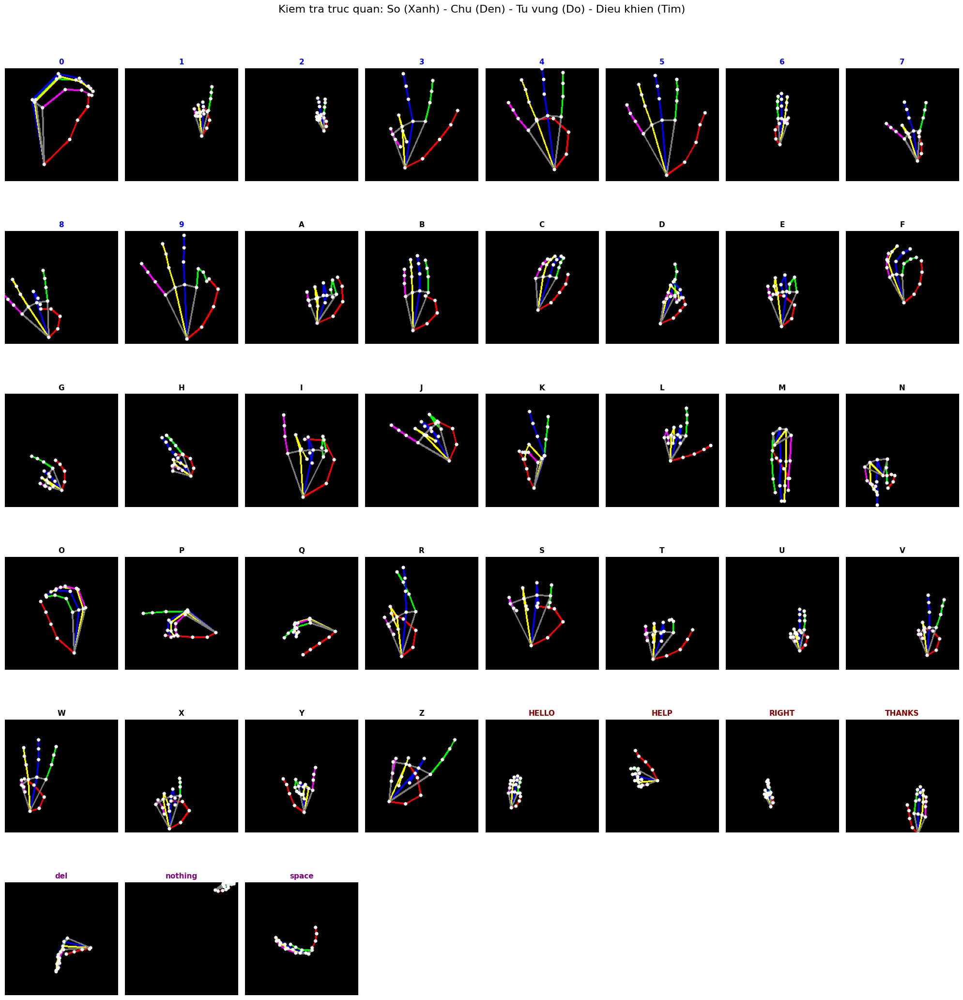

In [16]:
# --- CAP NHAT CELL 2.3: KIEM TRA TRUC QUAN (NANG CAO) ---
import numpy as np
import cv2
import matplotlib.pyplot as plt

if 'data' in globals() and 'labels' in globals():
    unique_labels = sorted(list(set(labels)))
    
    # 1. Phan loai thong minh
    digits = [l for l in unique_labels if l.isdigit()] # 0-9
    letters = [l for l in unique_labels if l.isalpha() and len(l) == 1] # A-Z
    
    # Cac tu vung (HELLO, THANKS...) - la chu nhung do dai > 1
    words = [l for l in unique_labels if l.isalpha() and len(l) > 1 and l not in ['nothing', 'space', 'del']]
    
    # Cac ky tu dieu khien (nothing, space, del)
    controls = [l for l in unique_labels if l in ['nothing', 'space', 'del', 'blank']]
    
    # Gop lai theo thu tu uu tien
    sorted_display_labels = sorted(digits) + sorted(letters) + sorted(words) + sorted(controls)
    
    print(f"Tong so lop: {len(sorted_display_labels)}")
    print(f"- So: {len(digits)} | Chu: {len(letters)} | Tu vung: {len(words)} | Dieu khien: {len(controls)}")
    
    # 2. Cau hinh luoi
    cols = 8
    rows = (len(sorted_display_labels) // cols) + 1
    plt.figure(figsize=(20, 3.5 * rows))
    
    # Dinh nghia mau sac & ket noi (nhu cu)
    finger_connections = {
        "thumb": [(0, 1), (1, 2), (2, 3), (3, 4)], "index": [(0, 5), (5, 6), (6, 7), (7, 8)],
        "middle": [(0, 9), (9, 10), (10, 11), (11, 12)], "ring": [(0, 13), (13, 14), (14, 15), (15, 16)],
        "pinky": [(0, 17), (17, 18), (18, 19), (19, 20)], "palm": [(0, 5), (5, 9), (9, 13), (13, 17), (0, 17)] 
    }
    colors = {"thumb": (255, 0, 0), "index": (0, 255, 0), "middle": (0, 0, 255), "ring": (255, 255, 0), "pinky": (255, 0, 255), "palm": (128, 128, 128)}

    for idx, target_label in enumerate(sorted_display_labels):
        try:
            # Lay mau dau tien tim thay cua label nay
            data_idx = labels.index(target_label)
        except ValueError: continue
            
        landmarks_vector = data[data_idx]
        H, W = 200, 200
        blank_image = np.zeros((H, W, 3), dtype=np.uint8)
        
        points = []
        for i in range(0, 42, 2):
            px, py = int(landmarks_vector[i] * W), int(landmarks_vector[i+1] * H)
            points.append((px, py))
            
        for finger, conns in finger_connections.items():
            for i_start, i_end in conns:
                if i_start < len(points) and i_end < len(points):
                    cv2.line(blank_image, points[i_start], points[i_end], colors[finger], 2)
        for p in points: cv2.circle(blank_image, p, 3, (255, 255, 255), -1)

        plt.subplot(rows, cols, idx + 1)
        plt.imshow(blank_image)
        
        # Doi mau tieu de de de nhan dien nhom
        if target_label in digits: t_color = 'blue'
        elif target_label in words: t_color = 'darkred' # Tu vung mau Do dam
        elif target_label in controls: t_color = 'purple'
        else: t_color = 'black'
            
        plt.title(f"{target_label}", fontsize=11, fontweight='bold', color=t_color)
        plt.axis('off')

    plt.suptitle("Kiem tra truc quan: So (Xanh) - Chu (Den) - Tu vung (Do) - Dieu khien (Tim)", y=1.01, fontsize=16)
    plt.tight_layout()
    plt.show()

## 2.4. Thống kê dữ liệu

Kiểm tra độ cân bằng của tập dữ liệu.

Tong so mau: 240113
- Chu so (0-9): 37731
- Chu cai (A-Z): 176021
- Ky tu dac biet: 26361


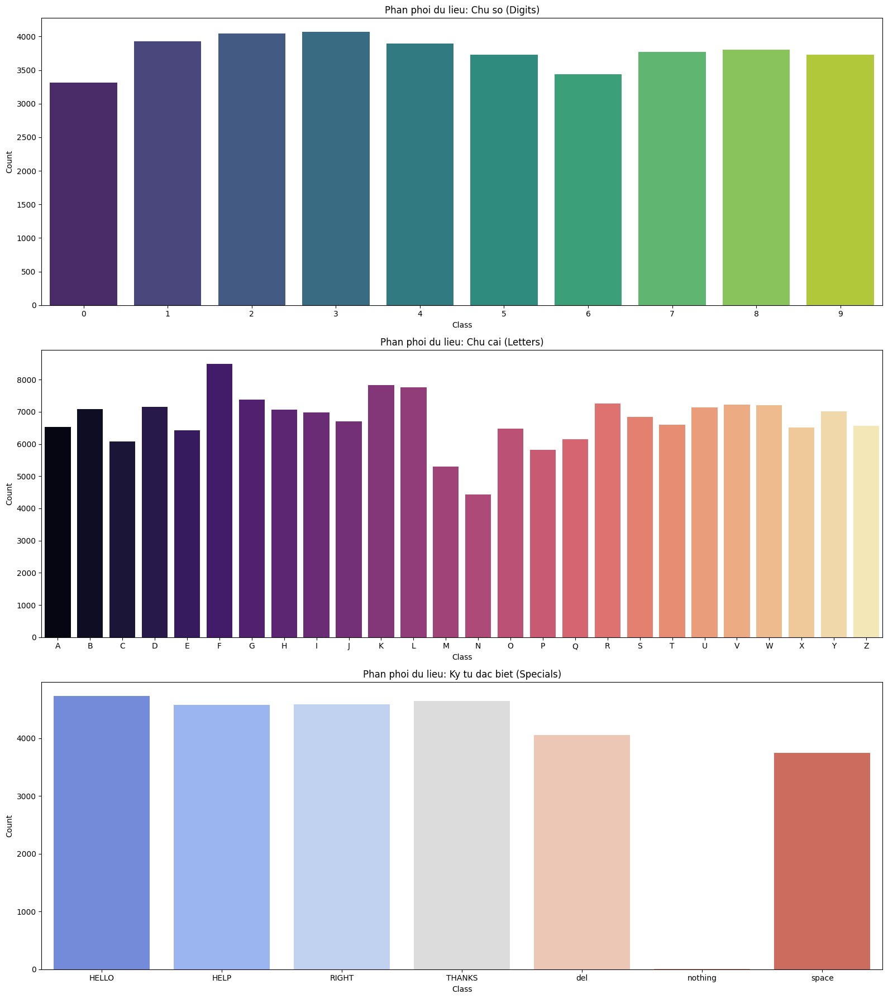

In [17]:
# --- CAP NHAT CELL 2.4: THONG KE PHAN PHOI THEO NHOM ---
import seaborn as sns

if 'labels' in globals():
    # Phan loai du lieu
    digits_data = [l for l in labels if l.isdigit()]
    letters_data = [l for l in labels if l.isalpha() and len(l) == 1]
    specials_data = [l for l in labels if l not in digits_data and l not in letters_data]
    
    print(f"Tong so mau: {len(labels)}")
    print(f"- Chu so (0-9): {len(digits_data)}")
    print(f"- Chu cai (A-Z): {len(letters_data)}")
    print(f"- Ky tu dac biet: {len(specials_data)}")
    
    fig, axes = plt.subplots(3, 1, figsize=(16, 18))
    
    # Bieu do 1: Chu so
    sns.countplot(x=digits_data, order=sorted(list(set(digits_data))), ax=axes[0], palette="viridis")
    axes[0].set_title("Phan phoi du lieu: Chu so (Digits)")
    axes[0].set_xlabel("Class")
    axes[0].set_ylabel("Count")
    
    # Bieu do 2: Chu cai
    sns.countplot(x=letters_data, order=sorted(list(set(letters_data))), ax=axes[1], palette="magma")
    axes[1].set_title("Phan phoi du lieu: Chu cai (Letters)")
    axes[1].set_xlabel("Class")
    axes[1].set_ylabel("Count")
    
    # Bieu do 3: Ky tu dac biet
    sns.countplot(x=specials_data, order=sorted(list(set(specials_data))), ax=axes[2], palette="coolwarm")
    axes[2].set_title("Phan phoi du lieu: Ky tu dac biet (Specials)")
    axes[2].set_xlabel("Class")
    axes[2].set_ylabel("Count")
    
    plt.tight_layout()
    plt.show()

## 2.7. Lưu dữ liệu

In [18]:
import os

# Đặt tên file mới
PROCESSED_DATA_PATH = 'new_data.pickle'

if not SKIP_PROCESSING:
    print("Đang lưu file dữ liệu...")
    
    # Tạo dictionary dữ liệu
    data_to_save = {'data': data, 'labels': labels}
    
    # Lưu file
    with open(PROCESSED_DATA_PATH, 'wb') as f:
        pickle.dump(data_to_save, f)
    
    # --- KIỂM TRA THÔNG TIN FILE ---
    # 1. Kiểm tra dung lượng file
    file_size_bytes = os.path.getsize(PROCESSED_DATA_PATH)
    file_size_mb = file_size_bytes / (1024 * 1024) # Đổi sang MB
    
    print(f"Đã lưu thành công: '{PROCESSED_DATA_PATH}'")
    print(f"Dung lượng file: {file_size_mb:.2f} MB")
    
    # 2. Kiểm tra cấu trúc dữ liệu bên trong
    print("\n--- CHI TIẾT DỮ LIỆU ---")
    print(f"Các trường (Keys): {list(data_to_save.keys())}")
    print(f"'data' (Vectors): {len(data_to_save['data'])} mẫu (Đơn vị: List các vector 42 chiều)")
    print(f"'labels' (Nhãn):  {len(data_to_save['labels'])} nhãn (Đơn vị: String tên folder)")
    
    # Kiểm tra nhanh mẫu đầu tiên để đảm bảo đúng format
    if len(data) > 0:
        print(f"Ví dụ mẫu đầu tiên (Length): {len(data[0])} features")

else:
    print(f"Không cần lưu (Dữ liệu đã được load từ {PROCESSED_DATA_PATH})")

Đang lưu file dữ liệu...
Đã lưu thành công: 'new_data.pickle'
Dung lượng file: 88.63 MB

--- CHI TIẾT DỮ LIỆU ---
Các trường (Keys): ['data', 'labels']
'data' (Vectors): 240113 mẫu (Đơn vị: List các vector 42 chiều)
'labels' (Nhãn):  240113 nhãn (Đơn vị: String tên folder)
Ví dụ mẫu đầu tiên (Length): 42 features


# 3. Train Model

## 3.1. Giải thích tham số huấn luyện

Chúng ta sử dụng mạng nơ-ron nhân tạo (ANN) với các cấu hình sau:

    Epochs = 100: Số vòng lặp huấn luyện tối đa. Kết hợp với Early Stopping để dừng sớm nếu không học thêm được.

    Batch Size = 32: Số lượng mẫu được cập nhật trọng số một lần. Size nhỏ giúp mô hình thoát khỏi điểm tối ưu cục bộ tốt hơn.

    Dropout (0.3): Kỹ thuật Regularization, tắt ngẫu nhiên 30% nơ-ron trong quá trình train để ép mạng học các đặc trưng tổng quát, tránh học vẹt (Overfitting).

    Activation 'ReLU': Hàm kích hoạt phi tuyến tính chuẩn cho các lớp ẩn.

Các thay đổi mới:

    SMOTE: Nó sẽ tự động nhân bản và biến đổi các vector số (0, 1, 2...) từ vài chục mẫu lên hàng nghìn mẫu để ngang bằng với chữ cái A, B, C.

    Class Weights: Đảm bảo rằng dù dữ liệu sinh ra có thể chưa hoàn hảo, mô hình vẫn bị phạt nặng nếu đoán sai các lớp thiểu số.

    Tăng Dropout: Vì dữ liệu SMOTE có tính chất lặp lại (gần giống nhau), tôi đã tăng Dropout lên 0.4 và 0.3 để tránh việc mô hình học thuộc lòng các mẫu nhân tạo này.

## 3.2. Chuẩn bị dữ liệu (Encoding & Splitting)

In [19]:
PROCESSED_DATA_PATH = 'new_data.pickle'

if os.path.exists(PROCESSED_DATA_PATH):
    with open(PROCESSED_DATA_PATH, 'rb') as f:
        data_dict = pickle.load(f)
        
    data_np = np.asarray(data_dict['data'])
    labels_raw = np.asarray(data_dict['labels'])
    
    # Mã hóa nhãn trước
    le = LabelEncoder()
    labels_encoded = le.fit_transform(labels_raw)
    num_classes = len(le.classes_)
    
    # Chia tập Train/Test TRƯỚC khi SMOTE (Quan trọng để tránh data leakage)
    x_train, x_test, y_train, y_test = train_test_split(
        data_np, labels_encoded, 
        test_size=0.2, 
        shuffle=True, 
        stratify=labels_encoded, 
        random_state=42
    )
    
    print(f"Dữ liệu gốc (Train): {x_train.shape}")
    
    # --- ÁP DỤNG THUẬT TOÁN SMOTE ---
    print("Đang áp dụng SMOTE để sinh dữ liệu nhân tạo cho các lớp thiếu (Số 0-9)...")
    
    # k_neighbors=3 vì số lượng mẫu của bạn quá ít (chỉ khoảng 5-10 mẫu/lớp số)
    # Nếu để mặc định là 5 có thể bị lỗi
    smote = SMOTE(random_state=42, k_neighbors=3) 
    
    x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)
    
    print(f"Dữ liệu sau khi SMOTE (Train): {x_train_resampled.shape}")
    
    # Kiểm tra lại phân phối sau khi SMOTE
    from collections import Counter
    print("Phân phối nhãn sau khi cân bằng (Top 5):")
    print(Counter(y_train_resampled).most_common(5))
    
    # Gán lại vào biến train chính để dùng cho các bước sau
    x_train = x_train_resampled
    y_train = y_train_resampled

    print(f"- Train set: {x_train.shape}")
    print(f"- Test set: {x_test.shape}")
else:
    print("Không tìm thấy file dữ liệu.")


Dữ liệu gốc (Train): (192090, 42)
Đang áp dụng SMOTE để sinh dữ liệu nhân tạo cho các lớp thiếu (Số 0-9)...
Dữ liệu sau khi SMOTE (Train): (292099, 42)
Phân phối nhãn sau khi cân bằng (Top 5):
[(np.int64(18), 6793), (np.int64(16), 6793), (np.int64(39), 6793), (np.int64(3), 6793), (np.int64(10), 6793)]
- Train set: (292099, 42)
- Test set: (48023, 42)


## 3.3. Xây dựng & Huấn luyện mô hình

In [20]:
# --- CAP NHAT CELL 3.3: MODEL ARCHITECTURE & TRAINING (FIXED) ---
import numpy as np
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# 1. Tinh toan Class Weights (Day la phan bi thieu gay ra loi NameError)
# Luu y: Can dam bao y_train da duoc tao ra tu Cell 3.2 truoc do
print("Dang tinh toan Class Weights...")
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights_dict = dict(enumerate(class_weights))
print(f"Da tinh xong trong so cho {len(class_weights_dict)} lop.")

# 2. Xay dung kien truc mo hinh (Architecture V18)
model = Sequential([
    Dense(512, input_shape=(42,)), 
    LeakyReLU(alpha=0.1),          
    BatchNormalization(),
    Dropout(0.4), 
    
    Dense(256),
    LeakyReLU(alpha=0.1),
    BatchNormalization(),
    Dropout(0.3),
    
    Dense(128),
    LeakyReLU(alpha=0.1),
    BatchNormalization(),
    Dropout(0.3),
    
    # Lop dau ra: num_classes lay tu Cell 3.2
    Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# 3. Cau hinh Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=1e-6, verbose=1)

# 4. Bat dau Huan luyen
print("Bat dau train model...")
history = model.fit(
    x_train, y_train,
    epochs=120, 
    batch_size=64,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, reduce_lr],
    class_weight=class_weights_dict, # Bien nay gio da duoc dinh nghia o buoc 1
    verbose=1
)


Dang tinh toan Class Weights...
Da tinh xong trong so cho 43 lop.


I0000 00:00:1770874556.841556      25 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1770874556.847835      25 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Bat dau train model...
Epoch 1/120


I0000 00:00:1770874561.417294     126 service.cc:152] XLA service 0x7c8824011a50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1770874561.417378     126 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1770874561.417383     126 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1770874561.853575     126 cuda_dnn.cc:529] Loaded cuDNN version 91002


  63/4565 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - accuracy: 0.1119 - loss: 3.7713

I0000 00:00:1770874564.606799     126 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


4565/4565 ━━━━━━━━━━━━━━━━━━━━ 22s 4ms/step - accuracy: 0.6967 - loss: 1.0769 - val_accuracy: 0.8277 - val_loss: 0.5958 - learning_rate: 0.0010
Epoch 2/120
4565/4565 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.8658 - loss: 0.4590 - val_accuracy: 0.8163 - val_loss: 0.5639 - learning_rate: 0.0010
Epoch 3/120
4565/4565 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.8887 - loss: 0.3795 - val_accuracy: 0.9211 - val_loss: 0.2705 - learning_rate: 0.0010
Epoch 4/120
4565/4565 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - accuracy: 0.8995 - loss: 0.3463 - val_accuracy: 0.9289 - val_loss: 0.2493 - learning_rate: 0.0010
Epoch 5/120
4565/4565 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.9086 - loss: 0.3111 - val_accuracy: 0.9347 - val_loss: 0.2337 - learning_rate: 0.0010
Epoch 6/120
4565/4565 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - accuracy: 0.9160 - loss: 0.2923 - val_accuracy: 0.9208 - val_loss: 0.2831 - learning_rate: 0.0010
Epoch 7/120
4565/4565 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - accuracy: 0.9194 -

In [21]:
# # Cấu hình Callbacks
# early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# # Bắt đầu huấn luyện
# history = model.fit(
#     x_train, y_train,
#     epochs=100,
#     batch_size=32,
#     validation_data=(x_test, y_test),
#     callbacks=[early_stop],
#     verbose=1
# )

## 3.4. Đánh giá & Lưu mô hình (Dynamic Saving)

Tên file mô hình sẽ tự động bao gồm: Độ chính xác (Acc) + Ngày giờ huấn luyện.

In [22]:
from sklearn.metrics import classification_report, top_k_accuracy_score
import time

# --- 3.4. DANH GIA CHI TIET MO HINH (DETAILED EVALUATION) ---

print("=== 1. TONG QUAN HIEU SUAT (PERFORMANCE OVERVIEW) ===")

# 1.1. Danh gia tren tap Test (Final Evaluation)
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=0)
print(f"Test Accuracy:  {test_acc * 100:.2f}%")
print(f"Test Loss:      {test_loss:.4f}")

# 1.2. Danh gia tren tap Train (de so sanh Overfitting)
train_loss, train_acc = model.evaluate(x_train, y_train, verbose=0)
print(f"Train Accuracy: {train_acc * 100:.2f}%")

# 1.3. Kiem tra Overfitting / Underfitting
print("\n=== 2. PHAN TICH OVERFITTING/UNDERFITTING ===")
acc_gap = train_acc - test_acc

print(f"Chenh lech (Train - Test): {acc_gap * 100:.2f}%")

if train_acc < 0.70:
    print("KET LUAN: Underfitting (Mo hinh chua hoc duoc dac trung).")
    print("GIAI PHAP: Tang do phuc tap mo hinh (them layer/neuron), train lau hon.")
elif acc_gap > 0.10: # Chenh lech > 10%
    print("KET LUAN: Overfitting nang (Hoc vet du lieu Train).")
    print("GIAI PHAP: Tang Dropout, giam do phuc tap mo hinh, them du lieu.")
elif acc_gap > 0.05: # Chenh lech > 5%
    print("KET LUAN: Co dau hieu Overfitting nhe.")
    print("GIAI PHAP: Chap nhan duoc, nhung co the tang nhe Dropout.")
else:
    print("KET LUAN: Mo hinh tot (Good Fit), on dinh giua Train va Test.")

# 1.4. Do toc do du doan (Inference Speed)
print("\n=== 3. TOC DO DU DOAN (INFERENCE SPEED) ===")
start_time = time.time()
y_pred_probs = model.predict(x_test, verbose=0)
end_time = time.time()

total_time = end_time - start_time
avg_time_per_sample = (total_time / len(x_test)) * 1000 # doi sang ms

print(f"Tong thoi gian du doan {len(x_test)} mau: {total_time:.4f} giay")
print(f"Trung binh moi mau: {avg_time_per_sample:.4f} ms")

# 1.5. Top-k Accuracy (Do chinh xac trong Top 3 va Top 5)
# (Huu ich voi ASL vi co nhieu ky tu gan giong nhau nhu M, N, S)
print("\n=== 4. TOP-K ACCURACY ===")
# Lay du doan class
y_pred = np.argmax(y_pred_probs, axis=1)

top3_acc = top_k_accuracy_score(y_test, y_pred_probs, k=3)
top5_acc = top_k_accuracy_score(y_test, y_pred_probs, k=5)

print(f"Top-3 Accuracy: {top3_acc * 100:.2f}% (Xac suat dap an dung nam trong 3 du doan cao nhat)")
print(f"Top-5 Accuracy: {top5_acc * 100:.2f}% (Xac suat dap an dung nam trong 5 du doan cao nhat)")

# 1.6. Bao cao chi tiet tung lop
print("\n=== 5. BAO CAO CHI TIET (CLASSIFICATION REPORT) ===")
print(classification_report(y_test, y_pred, target_names=le.classes_))

# --- DYNAMIC SAVING ---
print("\n=== 6. LUU MO HINH (SAVING) ===")
current_time = datetime.now().strftime("%Y%m%d_%H%M")
model_filename = f"model_acc{test_acc*100:.2f}_{current_time}.keras"

model.save(model_filename)
print(f"Da luu model: {model_filename}")

# Luu Label Encoder
with open('label_encoder.pickle', 'wb') as f:
    pickle.dump(le, f)
print("Da luu Label Encoder: label_encoder.pickle")

=== 1. TONG QUAN HIEU SUAT (PERFORMANCE OVERVIEW) ===
Test Accuracy:  97.93%
Test Loss:      0.0789
Train Accuracy: 98.52%

=== 2. PHAN TICH OVERFITTING/UNDERFITTING ===
Chenh lech (Train - Test): 0.59%
KET LUAN: Mo hinh tot (Good Fit), on dinh giua Train va Test.

=== 3. TOC DO DU DOAN (INFERENCE SPEED) ===
Tong thoi gian du doan 48023 mau: 3.3411 giay
Trung binh moi mau: 0.0696 ms

=== 4. TOP-K ACCURACY ===
Top-3 Accuracy: 99.53% (Xac suat dap an dung nam trong 3 du doan cao nhat)
Top-5 Accuracy: 99.73% (Xac suat dap an dung nam trong 5 du doan cao nhat)

=== 5. BAO CAO CHI TIET (CLASSIFICATION REPORT) ===
              precision    recall  f1-score   support

           0       0.90      0.99      0.94       662
           1       0.96      0.99      0.98       786
           2       0.93      0.99      0.96       809
           3       1.00      1.00      1.00       814
           4       0.98      0.97      0.98       779
           5       0.97      0.99      0.98       746
     

## 3.5. Biểu đồ Learning Curve & Confusion Matrix

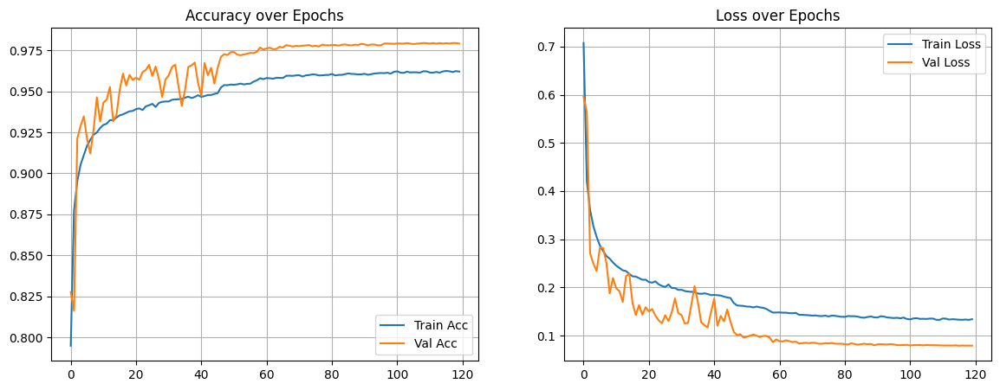

1501/1501 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step


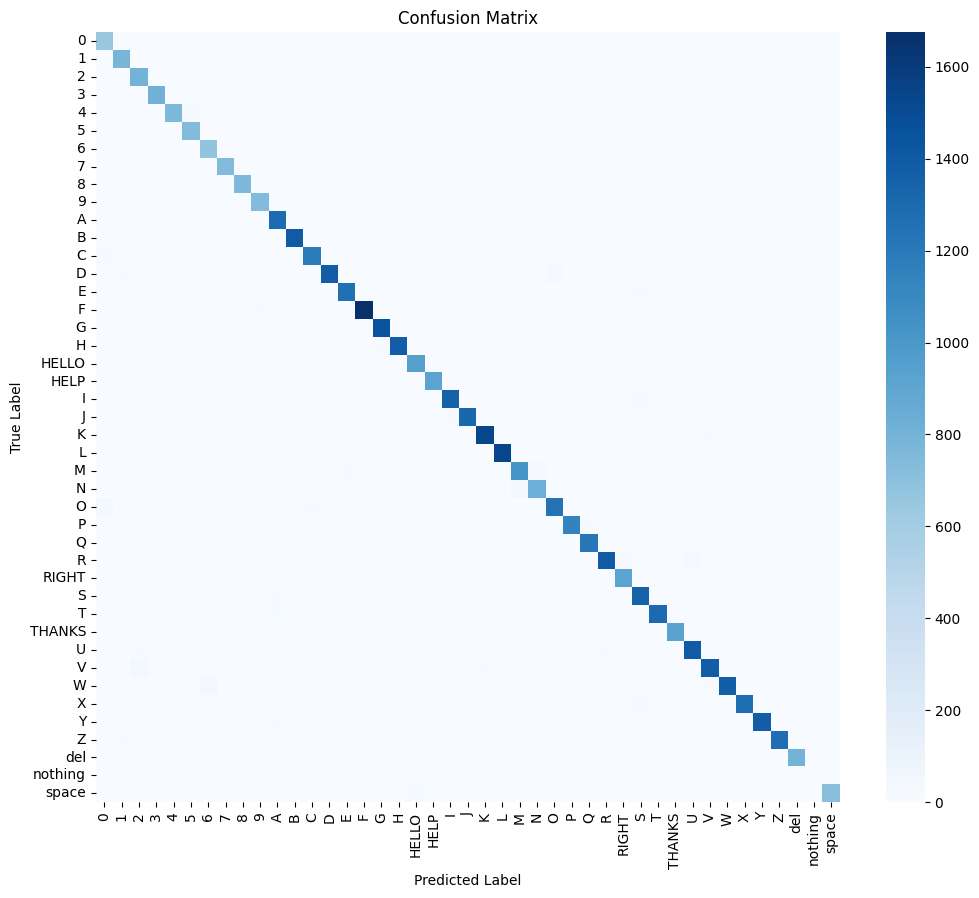

In [23]:
# Vẽ Learning Curve
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Vẽ Confusion Matrix
y_pred_prob = model.predict(x_test)
y_pred = np.argmax(y_pred_prob, axis=1)

plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', 
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

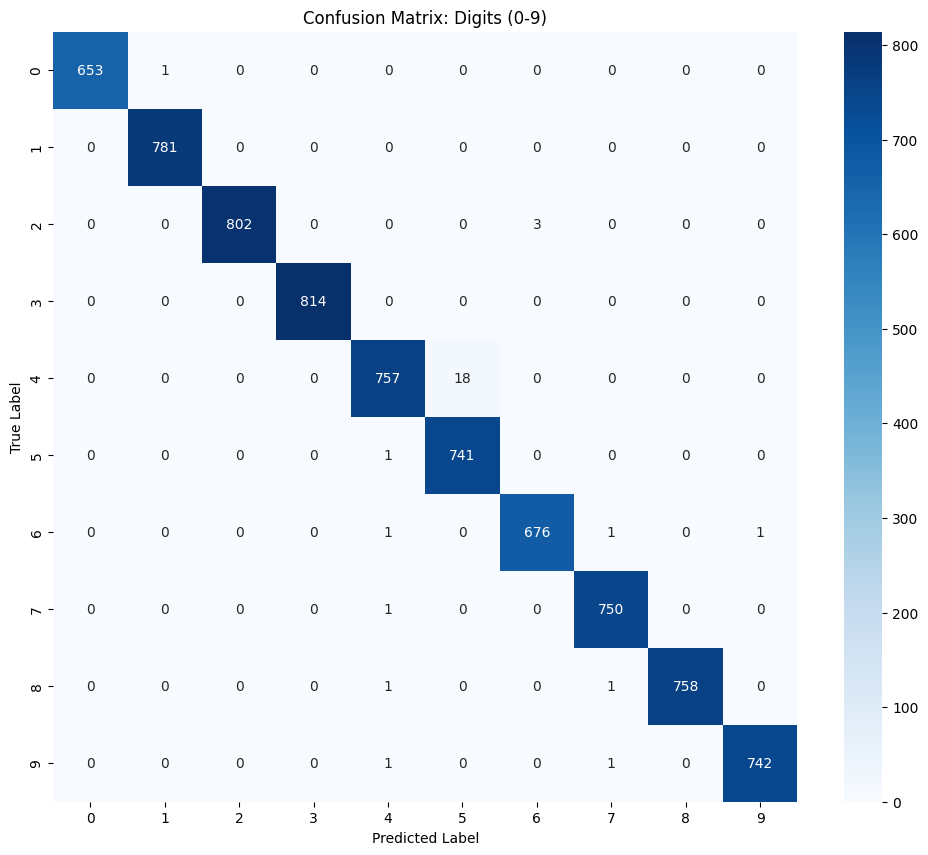

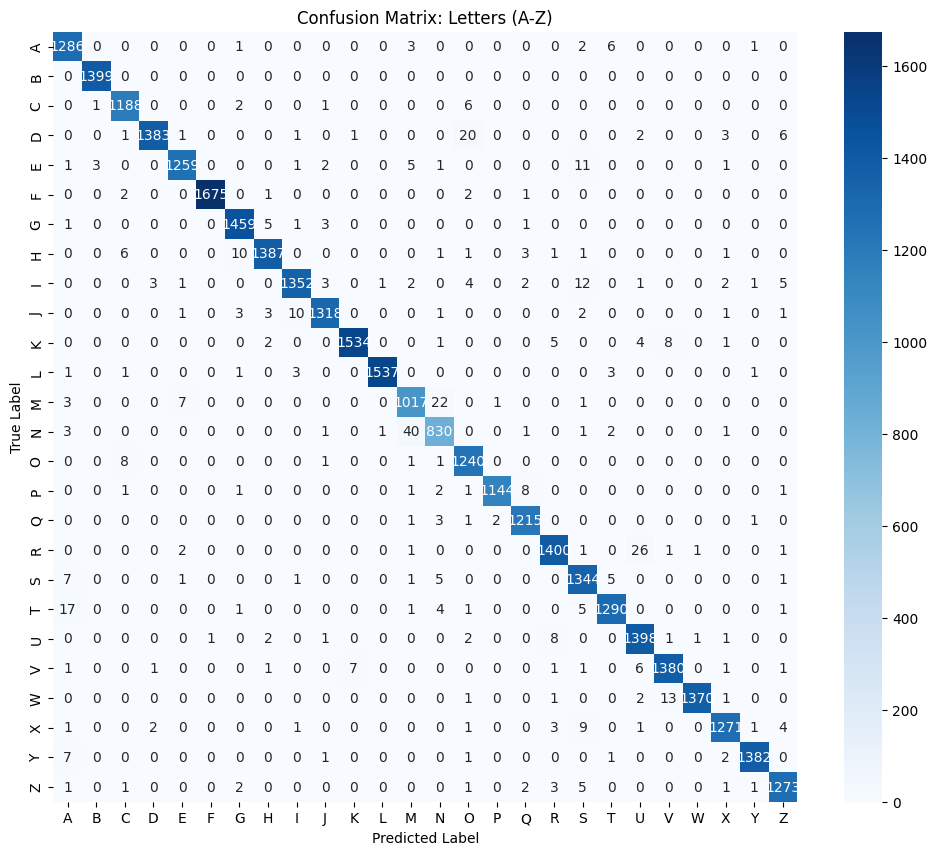

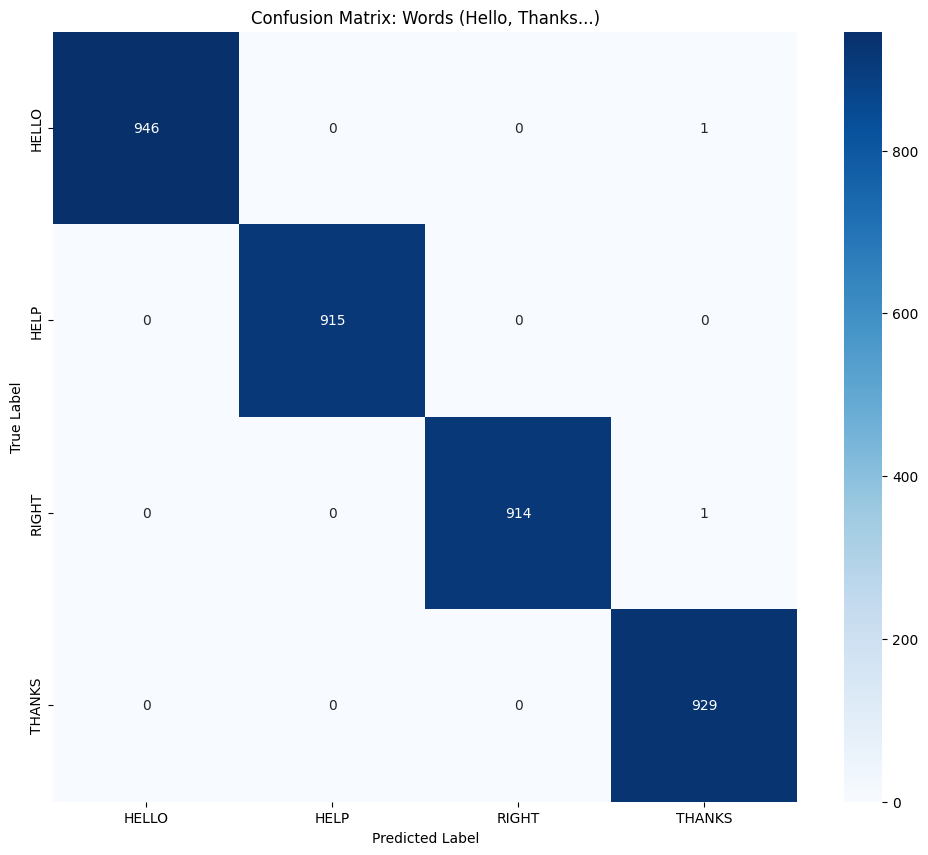

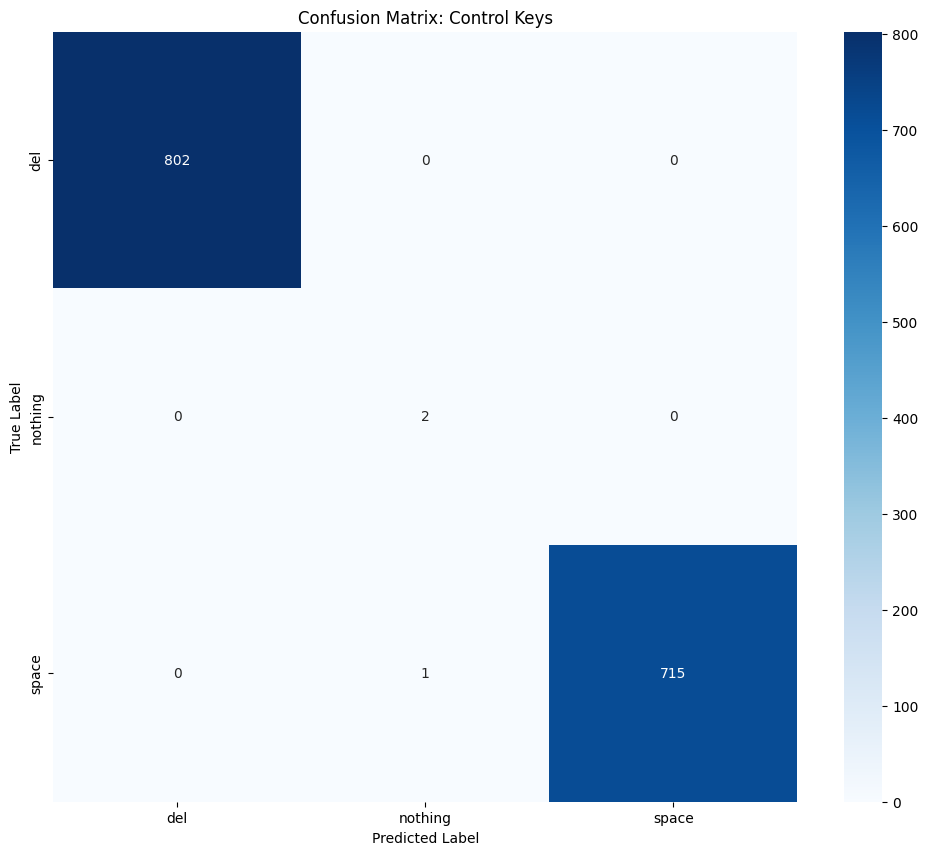

In [24]:
# --- CAP NHAT CELL 3.5: CONFUSION MATRIX THEO NHOM ---

# Lay du doan
y_pred_probs = model.predict(x_test, verbose=0)
y_pred = np.argmax(y_pred_probs, axis=1)

# Chuyen index nguoc lai thanh label string
y_test_labels = le.inverse_transform(y_test)
y_pred_labels = le.inverse_transform(y_pred)

# Ham ho tro ve Matrix theo danh sach label
def plot_subset_confusion_matrix(all_true, all_pred, target_labels, title):
    # Loc chi lay cac mau thuoc target_labels (dua tren y_true)
    indices = [i for i, label in enumerate(all_true) if label in target_labels]
    
    if not indices:
        print(f"Khong co du lieu cho nhom: {title}")
        return

    subset_true = [all_true[i] for i in indices]
    subset_pred = [all_pred[i] for i in indices]
    
    # Sap xep label de hien thi dep
    sorted_labels = sorted(target_labels)
    
    cm = confusion_matrix(subset_true, subset_pred, labels=sorted_labels)
    
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=sorted_labels, yticklabels=sorted_labels)
    plt.title(f"Confusion Matrix: {title}")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

# 1. Nhom Chu so
digits_labels = [l for l in le.classes_ if l.isdigit()]
plot_subset_confusion_matrix(y_test_labels, y_pred_labels, digits_labels, "Digits (0-9)")

# 2. Nhom Chu cai
letters_labels = [l for l in le.classes_ if l.isalpha() and len(l) == 1]
plot_subset_confusion_matrix(y_test_labels, y_pred_labels, letters_labels, "Letters (A-Z)")

# 3. Nhom Tu vung (Moi them)
words_labels = [l for l in le.classes_ if l.isalpha() and len(l) > 1 and l not in ['nothing', 'space', 'del']]
if len(words_labels) > 0:
    plot_subset_confusion_matrix(y_test_labels, y_pred_labels, words_labels, "Words (Hello, Thanks...)")

# 4. Nhom Ky tu dieu khien
controls_labels = [l for l in le.classes_ if l in ['nothing', 'space', 'del']]
plot_subset_confusion_matrix(y_test_labels, y_pred_labels, controls_labels, "Control Keys")

# 4. Test Model (Inference)

4.1. Giải thích tham số Test

Khi chạy thực tế trên tập Test (dữ liệu chưa từng thấy), ta cần điều chỉnh:

    min_hand_detection_confidence = 0.3: Dữ liệu thực tế thường nhiễu hơn training. Hạ ngưỡng này xuống 0.3 giúp tăng khả năng bắt được tay (Recall), tránh bỏ sót.

    c_score (Confidence Score): Hiển thị độ tự tin của mô hình với dự đoán đó (ví dụ: Chắc chắn 99% đây là chữ A).

## 4.2. Chạy Dự đoán (Inference Loop)

Đoạn code này thực hiện đầy đủ quy trình: Đọc ảnh -> Detect Landmarks -> Chuẩn hóa bounding box -> Predict -> Visualize kết quả.

W0000 00:00:1770876162.585797    3156 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770876162.606627    3157 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Bắt đầu kiểm thử và Visualize trên tập: /kaggle/working/ASL_TOTAL_TEST


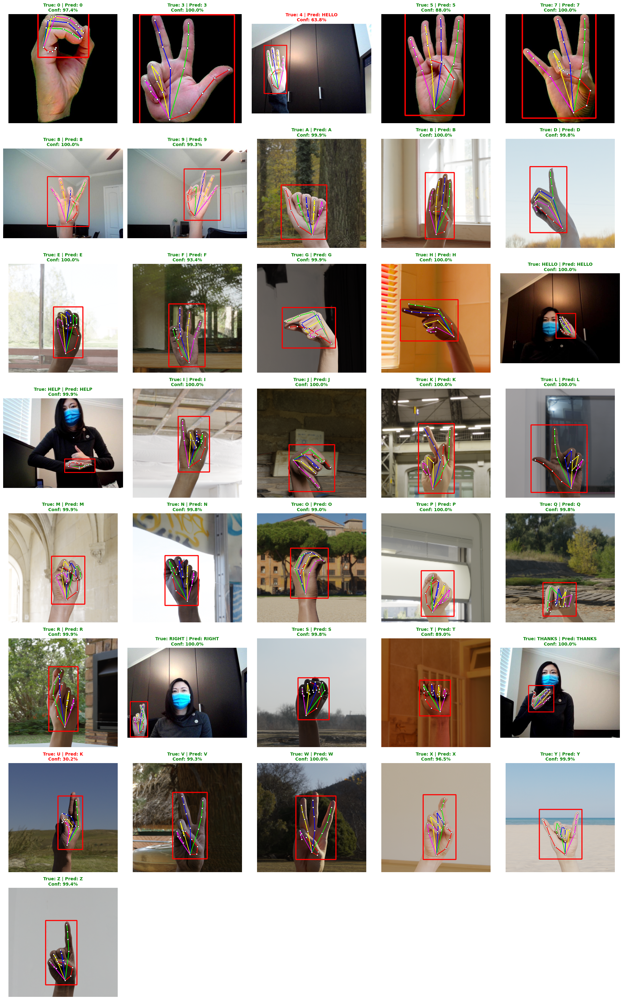

In [25]:
# --- CẬP NHẬT ĐƯỜNG DẪN TEST MỚI ---
TEST_DIR = '/kaggle/working/ASL_TOTAL_TEST'

# Load Model & Encoder
model = load_model(model_filename)
with open('label_encoder.pickle', 'rb') as f:
    le = pickle.load(f)

# Cấu hình Detector
base_options = python.BaseOptions(model_asset_path='hand_landmarker.task')
options = vision.HandLandmarkerOptions(
    base_options=base_options,
    num_hands=1,
    min_hand_detection_confidence=0.3
)
detector = vision.HandLandmarker.create_from_options(options)

print(f"Bắt đầu kiểm thử và Visualize trên tập: {TEST_DIR}")

total_test_samples = 0
correct_predictions = 0
results_per_class = {} 

test_classes = sorted(os.listdir(TEST_DIR))

# Chuẩn bị plot để hiển thị 1 ảnh đại diện cho mỗi class
# Tính toán số dòng cần thiết (mỗi dòng 5 ảnh)
num_classes_viz = len(test_classes)
cols = 5
rows = (num_classes_viz // cols) + (1 if num_classes_viz % cols > 0 else 0)
plt.figure(figsize=(20, 4 * rows))
viz_index = 1

for cls in test_classes:
    cls_path = os.path.join(TEST_DIR, cls)
    if not os.path.isdir(cls_path): continue
    
    img_files = os.listdir(cls_path)
    if len(img_files) == 0: continue

    results_per_class[cls] = [0, 0]
    
    # Chọn ngẫu nhiên 1 ảnh để visualize cho class này
    random_viz_img = random.choice(img_files)
    viz_img_processed = None
    viz_pred_char = ""
    viz_c_score = 0.0
    
    print(f"Testing class '{cls}'...", end="\r")
    
    for img_name in img_files:
        img_path = os.path.join(cls_path, img_name)
        frame = cv2.imread(img_path)
        if frame is None: continue
        
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame_rgb)
        detection_result = detector.detect(mp_image)

        if detection_result.hand_landmarks:
            hand_landmarks = detection_result.hand_landmarks[0]
            data_aux = []
            x_coords = []
            y_coords = []
            
            for lm in hand_landmarks:
                data_aux.extend([lm.x, lm.y])
                x_coords.append(lm.x)
                y_coords.append(lm.y)

            if len(data_aux) == 42:
                # Predict
                pred_prob = model.predict([np.asarray(data_aux).reshape(1, -1)], verbose=0)
                pred_idx = np.argmax(pred_prob)
                pred_char = le.inverse_transform([pred_idx])[0]
                c_score = np.max(pred_prob)
                
                # Thống kê
                results_per_class[cls][1] += 1
                total_test_samples += 1
                
                if pred_char.upper() == cls.upper():
                    results_per_class[cls][0] += 1
                    correct_predictions += 1
                
                # Xử lý ảnh Visualize (nếu là ảnh được chọn)
                if img_name == random_viz_img:
                    viz_pred_char = pred_char
                    viz_c_score = c_score
                    
                    # 1. Vẽ Landmarks
                    annotated_rgb = draw_landmarks_on_image_new(frame_rgb, detection_result)
                    
                    # 2. Vẽ Bounding Box
                    H, W, _ = frame.shape
                    x1 = int(min(x_coords) * W) - 20
                    y1 = int(min(y_coords) * H) - 20
                    x2 = int(max(x_coords) * W) + 20
                    y2 = int(max(y_coords) * H) + 20
                    
                    # Vẽ lên ảnh RGB (vì plt dùng RGB)
                    cv2.rectangle(annotated_rgb, (x1, y1), (x2, y2), (255, 0, 0), 3) # Đỏ trong RGB là (255,0,0)
                    viz_img_processed = annotated_rgb

    # Hiển thị ảnh đại diện cho Class vừa chạy xong
    if viz_img_processed is not None:
        plt.subplot(rows, cols, viz_index)
        plt.imshow(viz_img_processed)
        
        # Màu tiêu đề: Xanh nếu đúng, Đỏ nếu sai
        title_color = 'green' if viz_pred_char.upper() == cls.upper() else 'red'
        
        plt.title(f"True: {cls} | Pred: {viz_pred_char}\nConf: {viz_c_score:.1%}", 
                  color=title_color, fontsize=10, fontweight='bold')
        plt.axis('off')
        viz_index += 1

detector.close()
plt.tight_layout()
plt.show()

In [26]:
print("\n" + "="*40)
print("KẾT QUẢ KIỂM THỬ CHI TIẾT")
print("="*40)
if total_test_samples > 0:
    final_acc = correct_predictions / total_test_samples
    print(f"Độ chính xác trung bình: {final_acc * 100:.2f}%")
    print("-" * 40)
    print(f"{'CLASS':<10} | {'ACCURACY':<10} | {'SỐ LƯỢNG':<10}")
    print("-" * 40)
    for cls in results_per_class:
        correct, total = results_per_class[cls]
        if total > 0:
            acc_cls = (correct / total) * 100
            print(f"{cls:<10} | {acc_cls:<10.2f}% | {correct}/{total}")
else:
    print("Không có dữ liệu test hợp lệ.")


KẾT QUẢ KIỂM THỬ CHI TIẾT
Độ chính xác trung bình: 95.86%
----------------------------------------
CLASS      | ACCURACY   | SỐ LƯỢNG  
----------------------------------------
0          | 100.00    % | 23/23
1          | 95.45     % | 21/22
2          | 94.44     % | 17/18
3          | 100.00    % | 25/25
4          | 80.00     % | 20/25
5          | 100.00    % | 21/21
6          | 100.00    % | 20/20
7          | 100.00    % | 21/21
8          | 100.00    % | 15/15
9          | 100.00    % | 28/28
A          | 93.52     % | 101/108
B          | 95.05     % | 96/101
C          | 97.00     % | 97/100
D          | 93.26     % | 83/89
E          | 92.31     % | 96/104
F          | 96.19     % | 101/105
G          | 100.00    % | 104/104
H          | 99.05     % | 104/105
HELLO      | 100.00    % | 8/8
HELP       | 100.00    % | 6/6
I          | 96.97     % | 96/99
J          | 94.29     % | 99/105
K          | 96.12     % | 99/103
L          | 99.04     % | 103/104
M          | 96.81 

In [27]:
# --- CELL MOI: PHAN TICH XUNG DOT (CONFLICT ANALYSIS) ---

def analyze_confusion(class_name, confusion_targets, y_true_labels, y_pred_labels):
    """
    Kiem tra xem class_name dang bi nham lan voi nhung class nao trong danh sach targets
    """
    # Lay index cua cac mau thuc su la class_name
    indices = [i for i, label in enumerate(y_true_labels) if label == class_name]
    
    if not indices:
        print(f"Khong co mau test nao cho lop {class_name}")
        return

    total = len(indices)
    predictions = [y_pred_labels[i] for i in indices]
    
    print(f"\n--- PHAN TICH CHI TIET LOP '{class_name}' ({total} mau) ---")
    
    # Dem so luong du doan
    from collections import Counter
    counts = Counter(predictions)
    
    correct = counts[class_name]
    print(f"Chinh xac: {correct}/{total} ({correct/total*100:.2f}%)")
    
    print("Cac lop bi nham lan:")
    for label, count in counts.most_common():
        if label == class_name: continue
        if label in confusion_targets:
            print(f" -> BI NHAM THANH '{label}': {count} mau ({count/total*100:.2f}%) [CAN CHU Y]")
        else:
            print(f" -  Nham thanh '{label}': {count} mau")

# Kiem tra cac cap xung dot kinh dien trong ASL
print("KIEM TRA CAC CAP XUNG DOT KY HIEU:")
analyze_confusion("F", ["9"], y_test_labels, y_pred_labels)
analyze_confusion("V", ["2"], y_test_labels, y_pred_labels)
analyze_confusion("W", ["6"], y_test_labels, y_pred_labels)

KIEM TRA CAC CAP XUNG DOT KY HIEU:

--- PHAN TICH CHI TIET LOP 'F' (1699 mau) ---
Chinh xac: 1675/1699 (98.59%)
Cac lop bi nham lan:
 -> BI NHAM THANH '9': 12 mau (0.71%) [CAN CHU Y]
 -  Nham thanh 'C': 2 mau
 -  Nham thanh 'O': 2 mau
 -  Nham thanh '0': 2 mau
 -  Nham thanh 'HELLO': 2 mau
 -  Nham thanh 'space': 1 mau
 -  Nham thanh 'H': 1 mau
 -  Nham thanh '5': 1 mau
 -  Nham thanh 'Q': 1 mau

--- PHAN TICH CHI TIET LOP 'V' (1445 mau) ---
Chinh xac: 1380/1445 (95.50%)
Cac lop bi nham lan:
 -> BI NHAM THANH '2': 44 mau (3.04%) [CAN CHU Y]
 -  Nham thanh 'K': 7 mau
 -  Nham thanh 'U': 6 mau
 -  Nham thanh 'S': 1 mau
 -  Nham thanh 'X': 1 mau
 -  Nham thanh 'A': 1 mau
 -  Nham thanh 'Z': 1 mau
 -  Nham thanh 'R': 1 mau
 -  Nham thanh 'nothing': 1 mau
 -  Nham thanh 'H': 1 mau
 -  Nham thanh 'D': 1 mau

--- PHAN TICH CHI TIET LOP 'W' (1441 mau) ---
Chinh xac: 1370/1441 (95.07%)
Cac lop bi nham lan:
 -> BI NHAM THANH '6': 50 mau (3.47%) [CAN CHU Y]
 -  Nham thanh 'V': 13 mau
 -  Nham tha